# Compare the v4.2 recalibrated SDSS Stripe82 catalog 
# and the DES catalog

### use the SDSS g-i color and linear interpolation for bandpass transformations 

[Link to helper tools](#dataTools) 

[Link to data reading](#dataReading) 

[Link to data analysis](#dataAnalysis) 

In [1]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.table import hstack
import matplotlib.pyplot as plt 
import numpy as np
from astroML.plotting import hist
# for astroML installation see https://www.astroml.org/user_guide/installation.html

In [22]:
## automatically reload any modules read below that might have changed (e.g. plots)
%load_ext autoreload
%autoreload 2
# importing ZI tools: 
import ZItools as zit
# importing Karun's tools: 
import KTtools as ktt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<a id='dataTools'></a>

### Helper Tools

In [3]:
# robust standard deviation
def sigG(arr):
    return 0.741*(np.quantile(arr, 0.75)-np.quantile(arr, 0.25))

In [4]:
### code for generating new quantities, such as dra, ddec, colors, differences in mags, etc
def derivedColumns(matches, newFlag=1):
    matches['ra'] = matches['ra_new']
    matches['dec'] = matches['dec_new']
    matches['dra'] = (matches['ra']-matches['raDES'])*3600
    matches['ddec'] = (matches['dec']-matches['decDES'])*3600
    ra = matches['ra'] 
    matches['raW'] = np.where(ra > 180, ra-360, ra) 
    if (newFlag):
        matches['u_mMed'] = matches['u_mMed_new']
        matches['g_mMed'] = matches['g_mMed_new']
        matches['r_mMed'] = matches['r_mMed_new']
        matches['i_mMed'] = matches['i_mMed_new']
        matches['z_mMed'] = matches['z_mMed_new']
    matches['dg'] = matches['g_mMed'] - matches['gDES'] 
    matches['dr'] = matches['r_mMed'] - matches['rDES'] 
    matches['di'] = matches['i_mMed'] - matches['iDES'] 
    matches['dz'] = matches['z_mMed'] - matches['zDES'] 
    matches['gr'] = matches['g_mMed'] - matches['r_mMed']
    matches['ri'] = matches['r_mMed'] - matches['i_mMed']
    matches['gi'] = matches['g_mMed'] - matches['i_mMed']
    matches['iz'] = matches['i_mMed'] - matches['z_mMed']
    matches['dgr'] = matches['dg'] - matches['dr'] 
    matches['dri'] = matches['dr'] - matches['di'] 
    matches['diz'] = matches['di'] - matches['dz'] 
    matches['drz'] = matches['dr'] - matches['dz'] 
    matches['dgi'] = matches['dg'] - matches['di'] 
    return

In [5]:
def doOneColor(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    # this is where the useable range of color specified by Xstr is defined
    # it's really a hack - these limits should be passed via kw... 
    xMin = 0.5
    xMax = 3.1
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, xMin, xMax, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    # THERE IS NO ANALYTIC COLOR TERM: linear interpolation of the binned medians! 
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    # the following line corrects the trend given by the binned medians 
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    # note that we only use the restricted range of color for ZP analysis
    # 0.3 mag limit is to reject gross outliers
    goodC = d[(np.abs(d['colorresid'])<0.3)&(xVec>xMin)&(xVec<xMax)]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel =kw['Ystr'] + ' residuals'
    kwOC = {"Xstr":'raW', "Xmin":-45, "Xmax":47, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-43, "XmaxBin":45, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    plotName = plotNameRoot + '_RA_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)  
    print('made plot', plotName)


    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotName = plotNameRoot + '_Dec.png'
    kwOC = {"Xstr":'dec', "Xmin":-1.3, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-1.26, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    plotName = plotNameRoot + '_Dec_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)  
    print('made plot', plotName)


    # r SDSS
    print('-----------')
    print(' stats for SDSS r binning medians:')
    plotName = plotNameRoot + '_rmag.png'    
    kwOC = {"Xstr":'r_mMed', "Xmin":14.3, "Xmax":22.2, "Xlabel":'SDSS r (mag)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":14.5, "XmaxBin":21.5, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    plotName = plotNameRoot + '_rmag_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)  
    print('made plot', plotName)
    print('------------------------------------------------------------------')
   

<a id='dataReading'></a>

### Define paths and catalogs 

In [6]:
ZIdataDir = "/Users/ivezic/Work/Science/CalibrationV2/SDSS_SSC/Data"
# Doug's match of v3.2 and DES catalog  
DEScatalog = ZIdataDir + "/" + "match_stripe82calibStars_v3.2_des_dr1_cleaned.csv" 
colnamesSDSSDES = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2', 
                'idDES', 'raDES', 'decDES', 
                'gDES', 'rDES', 'iDES', 'zDES', 'yDES', 
                'gErrDES', 'rErrDES', 'iErrDES', 'zErrDES', 'yErrDES', 
                'gNobsDES', 'rNobsDES', 'iNobsDES', 'zNobsDES', 'yNobsDES', 'sep']

In [8]:
sdssDESraw = Table.read(DEScatalog, format='csv', names=colnamesSDSSDES) 
print(np.size(sdssDESraw))

619741


<a id='dataReading'></a>

### Overwrite SDSS catalog with a new one!

In [9]:
## read the latest and greatest SDSS catalog
colnamesSDSS = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2']

sdssNewCatIn = ZIdataDir + "/" + "stripe82calibStars_v4.2.dat"
# sdssNewCatIn = ZIdataDir + "/" + "stripe82calibStars_v3.1.dat"

readFormat = 'ascii'
sdssNew = Table.read(sdssNewCatIn, format=readFormat, names=colnamesSDSS)
np.size(sdssNew)

991472

In [10]:
## now match sdssDES to sdssNew 
sdssDES_coords = SkyCoord(ra = sdssDESraw['ra']*u.degree, dec= sdssDESraw['dec']*u.degree) 
sdssNew_coords = SkyCoord(ra = sdssNew['ra']*u.degree, dec= sdssNew['dec']*u.degree) 
idx, d2d, d3d = sdssNew_coords.match_to_catalog_sky(sdssDES_coords)  
sdssDESnew = hstack([sdssNew, sdssDESraw[idx]], table_names = ['new', 'old'])
sdssDESnew['sep_2d_arcsec'] = d2d.arcsec
# good matches between the old and new catalogs
MAX_DISTANCE_ARCSEC = 0.5
sdssDES = sdssDESnew[(sdssDESnew['sep_2d_arcsec'] < MAX_DISTANCE_ARCSEC)]
print(np.size(sdssDES))
## and now overwrite all SDSS fields 

619741


In [11]:
#sdssDES

In [12]:
derivedColumns(sdssDES)

In [13]:
sdssDESbright = sdssDES[(sdssDES['r_mMed']>14)&(sdssDES['r_mMed']<20)]
print(np.size(sdssDES), np.size(sdssDESbright))

619741 328645


=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -2.437180000144229e-05 std.dev.All: 0.019841721339372786
N= 552088 min= -0.2994137500000007 max= 0.29990323960000065
median: -0.000164032574997839 std.dev: 0.0049147177902986155
saved plot as: colorResidDES42_dg_RA.png


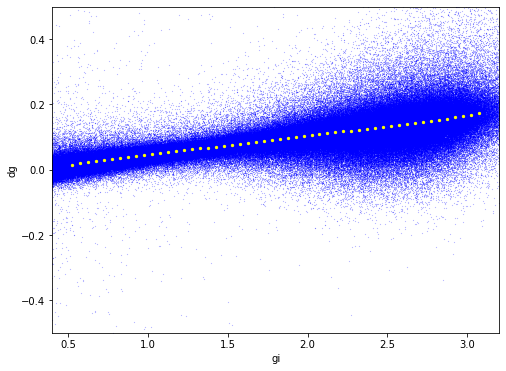

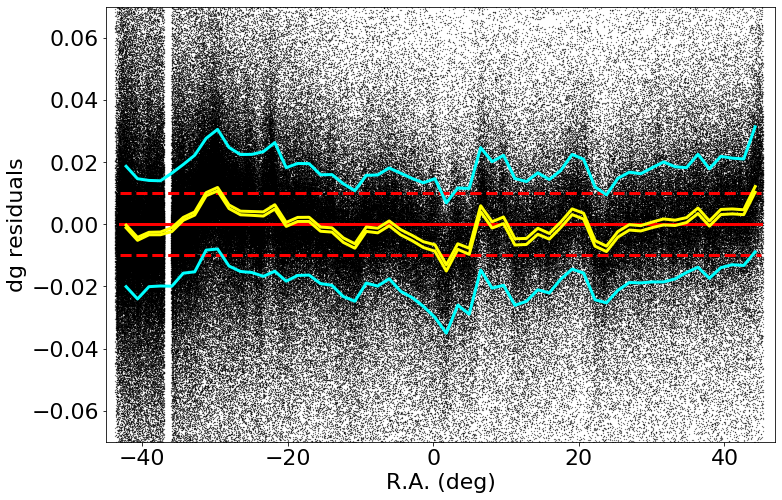

made plot colorResidDES42_dg_RA.png
medianAll: -2.437180000144229e-05 std.dev.All: 0.019841721339372786
N= 552088 min= -0.2994137500000007 max= 0.29990323960000065
median: -0.0006716517999977301 std.dev: 0.004811266654927459
saved plot as: colorResidDES42_dg_RA_Hess.png


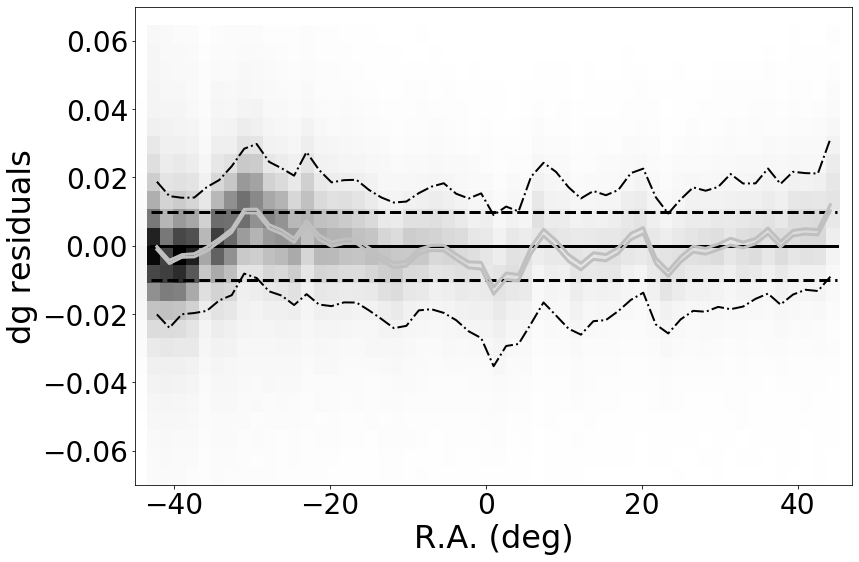

made plot colorResidDES42_dg_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -2.437180000144229e-05 std.dev.All: 0.019841721339372786
N= 552088 min= -0.2994137500000007 max= 0.29990323960000065
median: 0.0005737826999989998 std.dev: 0.0022094534375669576
saved plot as: colorResidDES42_dg_Dec.png


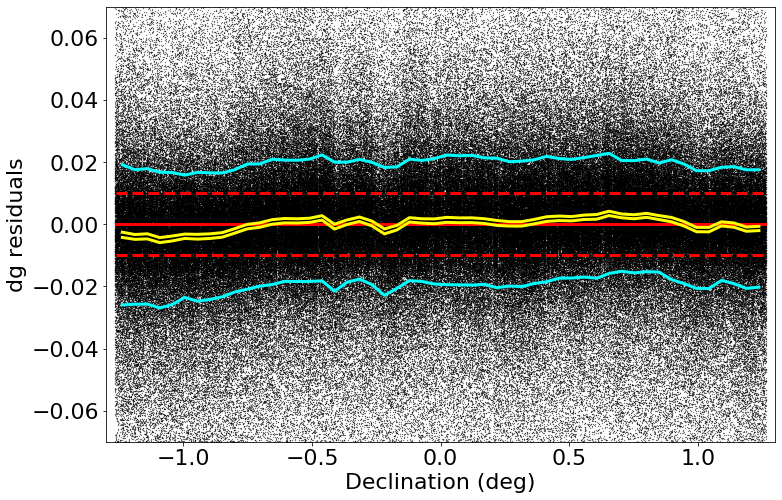

made plot colorResidDES42_dg_Dec.png
medianAll: -2.437180000144229e-05 std.dev.All: 0.019841721339372786
N= 552088 min= -0.2994137500000007 max= 0.29990323960000065
median: 0.0005059409999989967 std.dev: 0.002229426091225594
saved plot as: colorResidDES42_dg_Dec_Hess.png


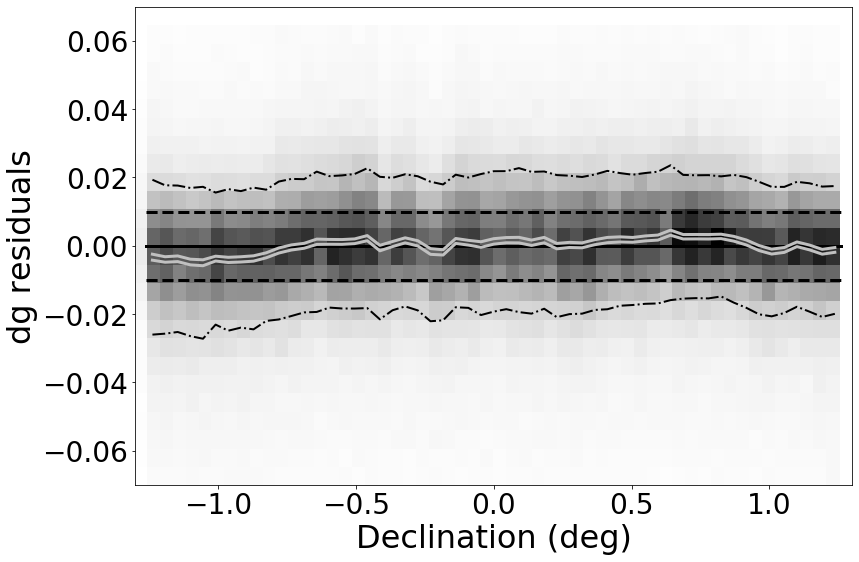

made plot colorResidDES42_dg_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -2.437180000144229e-05 std.dev.All: 0.019841721339372786
N= 552088 min= -0.2994137500000007 max= 0.29990323960000065
median: 0.0015507778000022343 std.dev: 0.0068947704394266476
saved plot as: colorResidDES42_dg_rmag.png


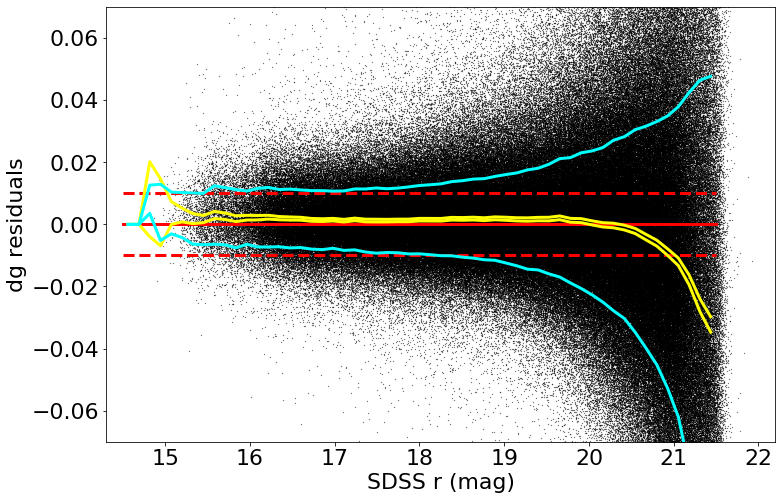

made plot colorResidDES42_dg_rmag.png
medianAll: -2.437180000144229e-05 std.dev.All: 0.019841721339372786
N= 552088 min= -0.2994137500000007 max= 0.29990323960000065
median: 0.0015507778000022343 std.dev: 0.0068947704394266476
saved plot as: colorResidDES42_dg_rmag_Hess.png


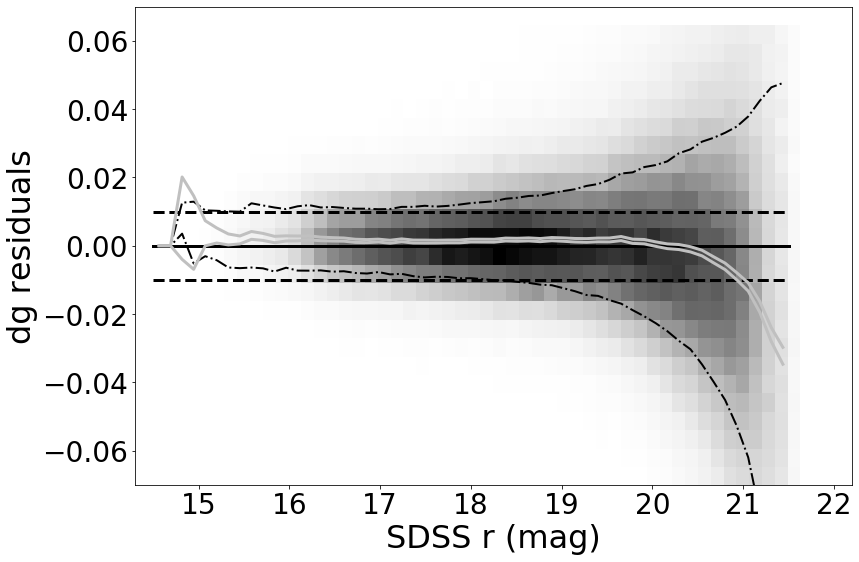

made plot colorResidDES42_dg_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: -1.6119999999730794e-05 std.dev.All: 0.01383393996269919
N= 552733 min= -0.29831346790000224 max= 0.29830732539999977
median: -0.000283009025001682 std.dev: 0.0033818744926003438
saved plot as: colorResidDES42_dr_RA.png


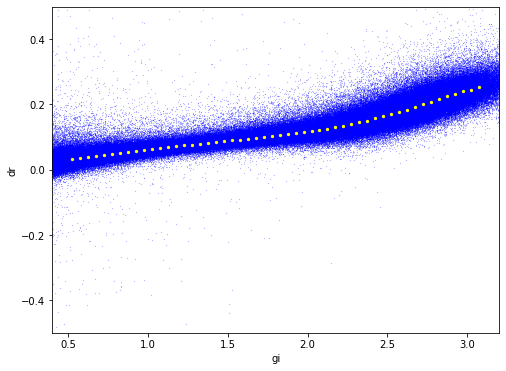

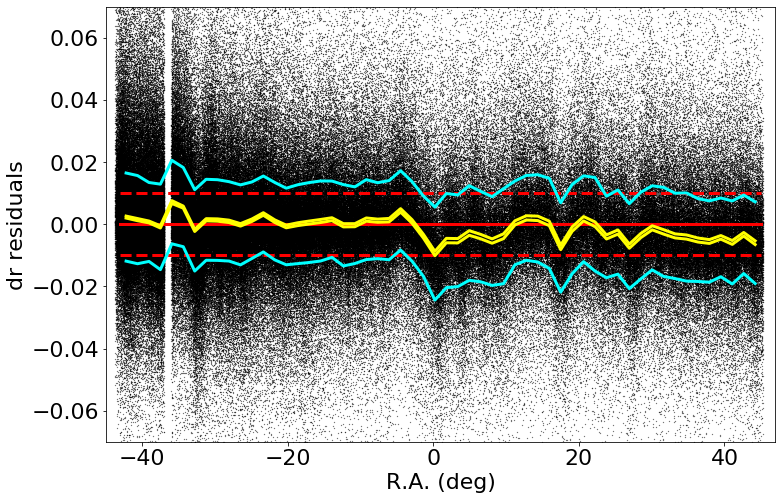

made plot colorResidDES42_dr_RA.png
medianAll: -1.6119999999730794e-05 std.dev.All: 0.01383393996269919
N= 552733 min= -0.29831346790000224 max= 0.29830732539999977
median: -0.0004044841999961968 std.dev: 0.0034168619023684462
saved plot as: colorResidDES42_dr_RA_Hess.png


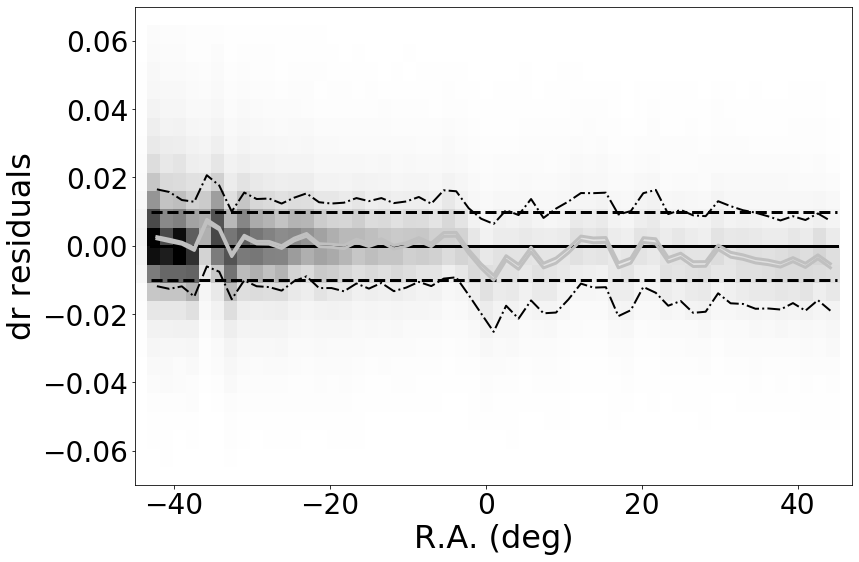

made plot colorResidDES42_dr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.6119999999730794e-05 std.dev.All: 0.01383393996269919
N= 552733 min= -0.29831346790000224 max= 0.29830732539999977
median: -0.00018692785000014311 std.dev: 0.001049331232163843
saved plot as: colorResidDES42_dr_Dec.png


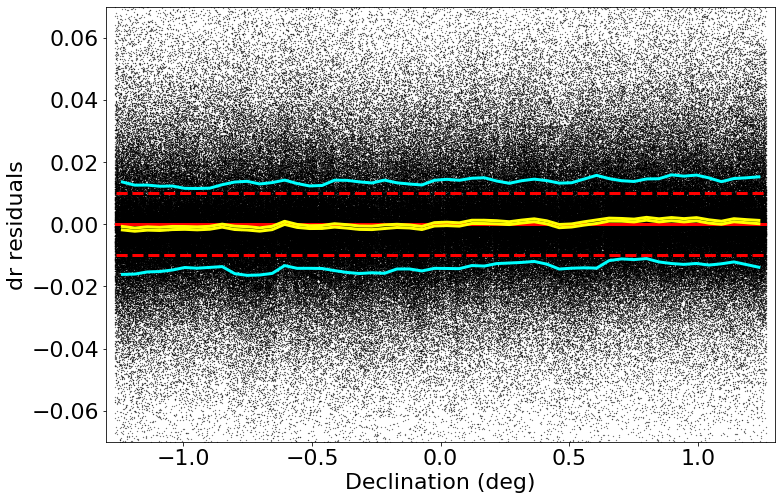

made plot colorResidDES42_dr_Dec.png
medianAll: -1.6119999999730794e-05 std.dev.All: 0.01383393996269919
N= 552733 min= -0.29831346790000224 max= 0.29830732539999977
median: -0.0002555467500018442 std.dev: 0.0010606940886601606
saved plot as: colorResidDES42_dr_Dec_Hess.png


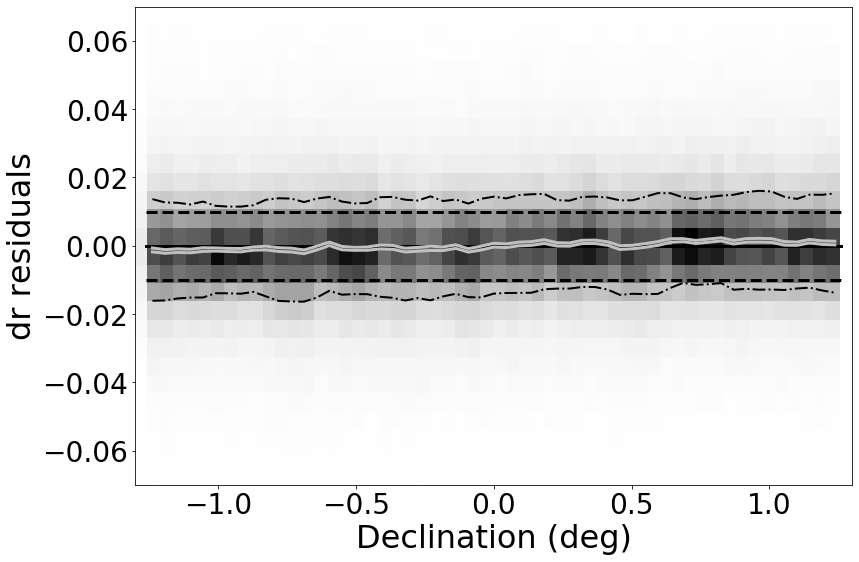

made plot colorResidDES42_dr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.6119999999730794e-05 std.dev.All: 0.01383393996269919
N= 552733 min= -0.29831346790000224 max= 0.29830732539999977
median: -0.0010088648000030204 std.dev: 0.002628684860273956
saved plot as: colorResidDES42_dr_rmag.png


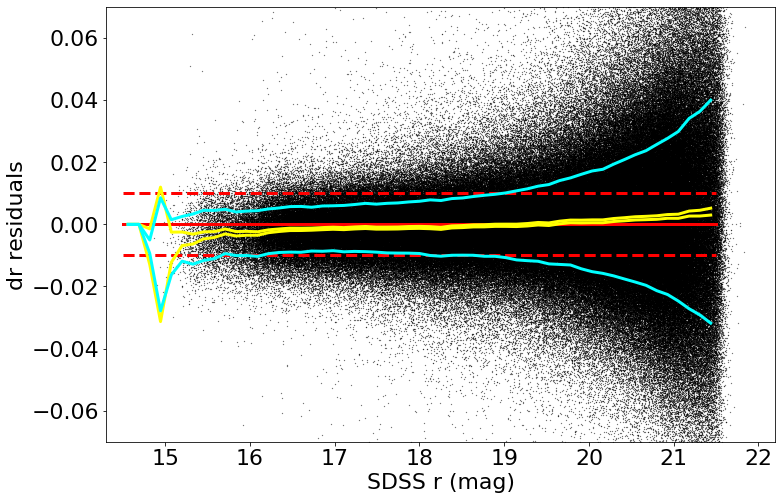

made plot colorResidDES42_dr_rmag.png
medianAll: -1.6119999999730794e-05 std.dev.All: 0.01383393996269919
N= 552733 min= -0.29831346790000224 max= 0.29830732539999977
median: -0.0010088648000030204 std.dev: 0.002628684860273956
saved plot as: colorResidDES42_dr_rmag_Hess.png


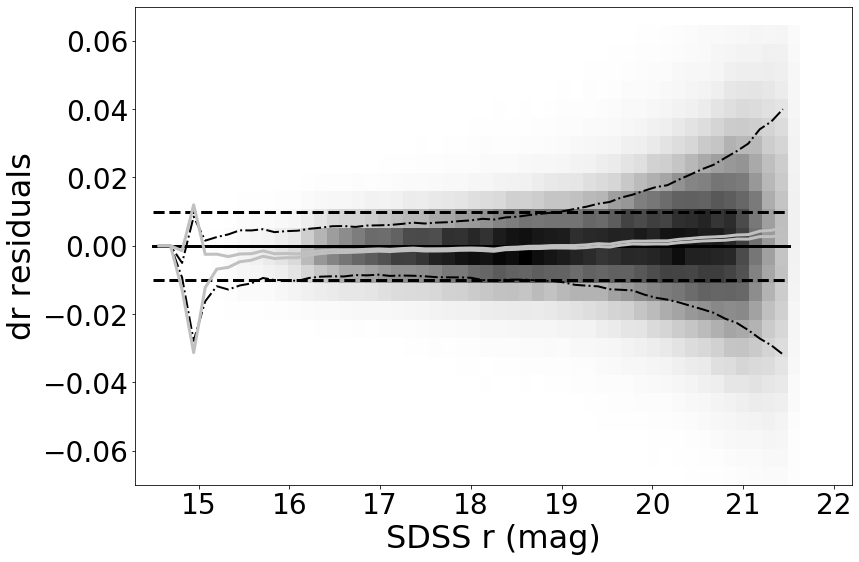

made plot colorResidDES42_dr_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: -2.1994999997193565e-05 std.dev.All: 0.014687290308598456
N= 552753 min= -0.29781802260000134 max= 0.2996832740000009
median: -0.0048760203249995585 std.dev: 0.005895187966721817
saved plot as: colorResidDES42_di_RA.png


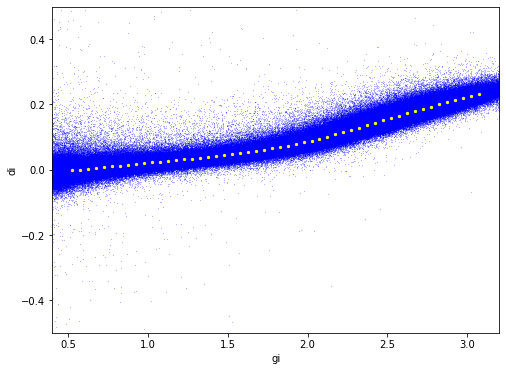

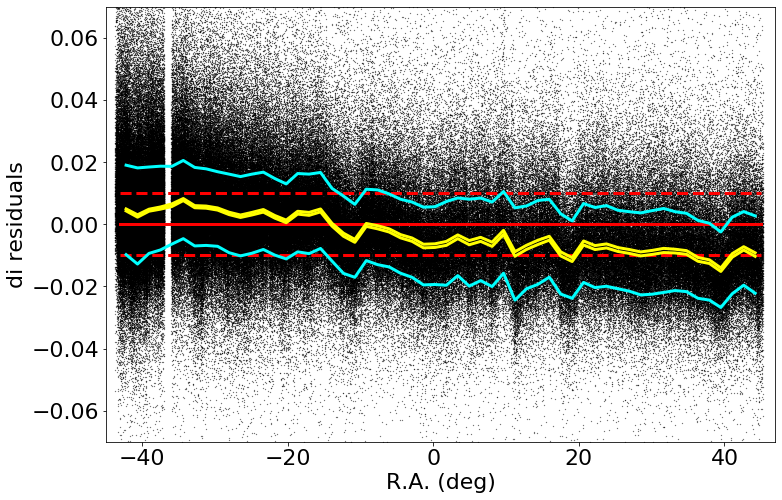

made plot colorResidDES42_di_RA.png
medianAll: -2.1994999997193565e-05 std.dev.All: 0.014687290308598456
N= 552753 min= -0.29781802260000134 max= 0.2996832740000009
median: -0.00475869720000302 std.dev: 0.0058626906825335195
saved plot as: colorResidDES42_di_RA_Hess.png


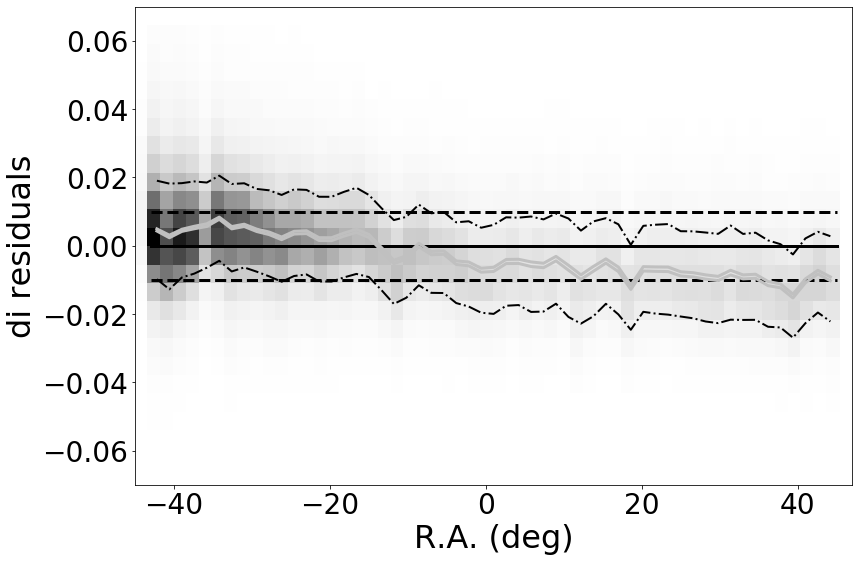

made plot colorResidDES42_di_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -2.1994999997193565e-05 std.dev.All: 0.014687290308598456
N= 552753 min= -0.29781802260000134 max= 0.2996832740000009
median: 0.00014533034999945232 std.dev: 0.001853008537053651
saved plot as: colorResidDES42_di_Dec.png


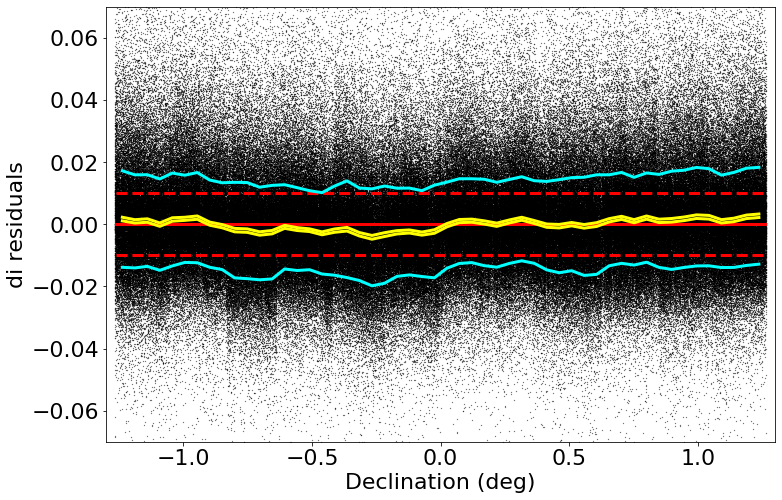

made plot colorResidDES42_di_Dec.png
medianAll: -2.1994999997193565e-05 std.dev.All: 0.014687290308598456
N= 552753 min= -0.29781802260000134 max= 0.2996832740000009
median: 0.00026981954999999447 std.dev: 0.0018845596595013906
saved plot as: colorResidDES42_di_Dec_Hess.png


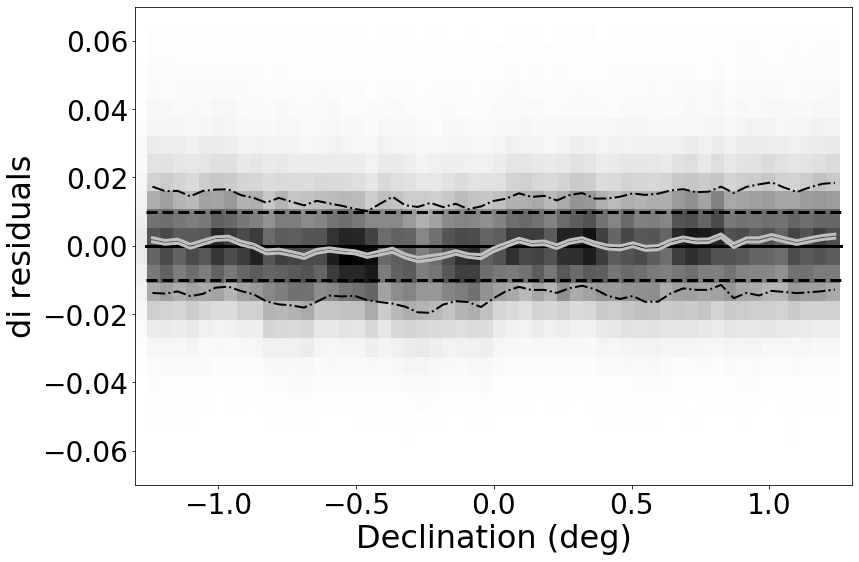

made plot colorResidDES42_di_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -2.1994999997193565e-05 std.dev.All: 0.014687290308598456
N= 552753 min= -0.29781802260000134 max= 0.2996832740000009
median: -0.0015808110000010978 std.dev: 0.004090714614147312
saved plot as: colorResidDES42_di_rmag.png


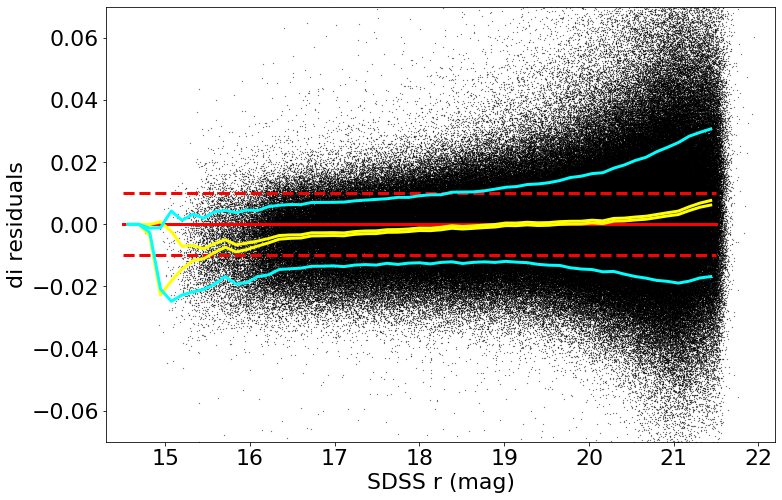

made plot colorResidDES42_di_rmag.png
medianAll: -2.1994999997193565e-05 std.dev.All: 0.014687290308598456
N= 552753 min= -0.29781802260000134 max= 0.2996832740000009
median: -0.0015808110000010978 std.dev: 0.004090714614147312
saved plot as: colorResidDES42_di_rmag_Hess.png


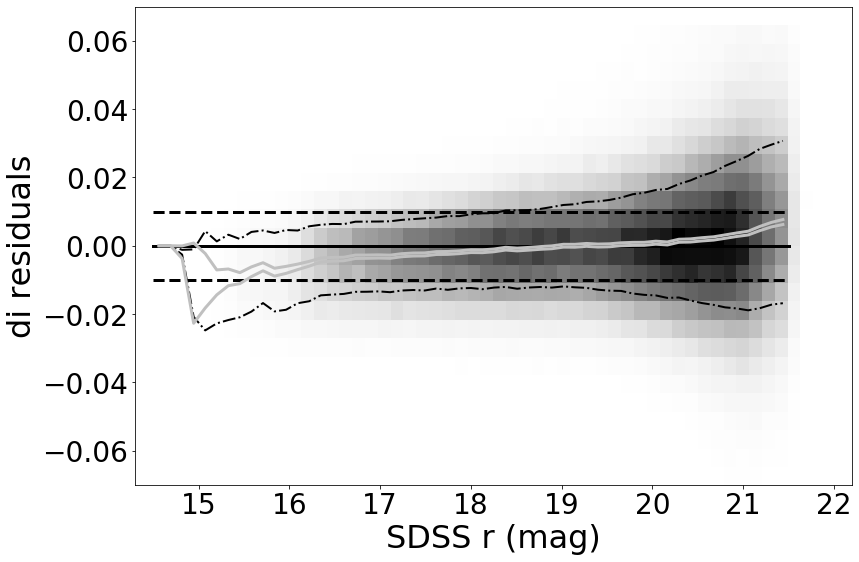

made plot colorResidDES42_di_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: -1.5792999996204482e-06 std.dev.All: 0.023282698093200715
N= 552501 min= -0.2997165936999991 max= 0.29992520999999783
median: -0.003733837850002877 std.dev: 0.012411072617193507
saved plot as: colorResidDES42_dz_RA.png


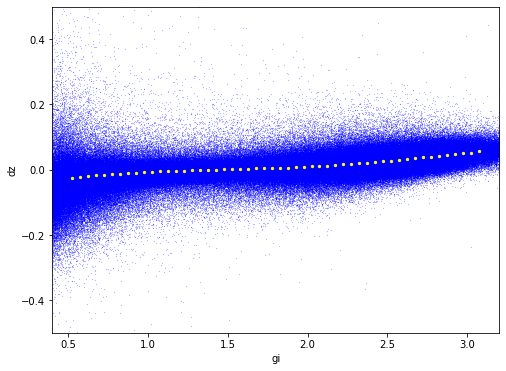

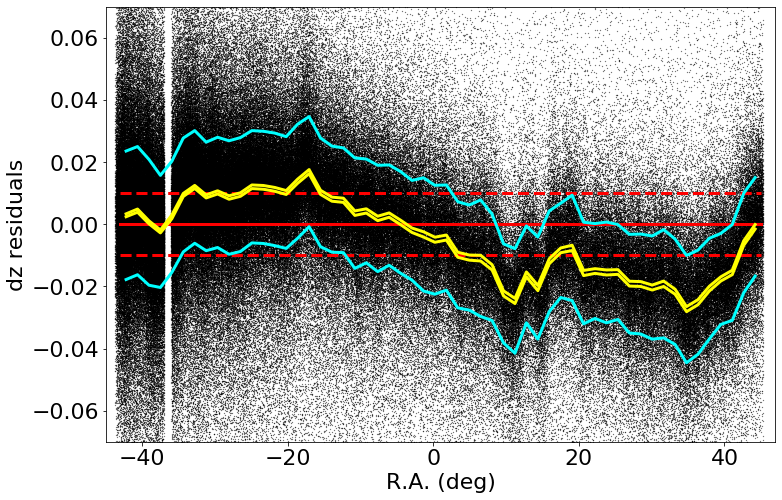

made plot colorResidDES42_dz_RA.png
medianAll: -1.5792999996204482e-06 std.dev.All: 0.023282698093200715
N= 552501 min= -0.2997165936999991 max= 0.29992520999999783
median: -0.003441984999997591 std.dev: 0.012385482983293488
saved plot as: colorResidDES42_dz_RA_Hess.png


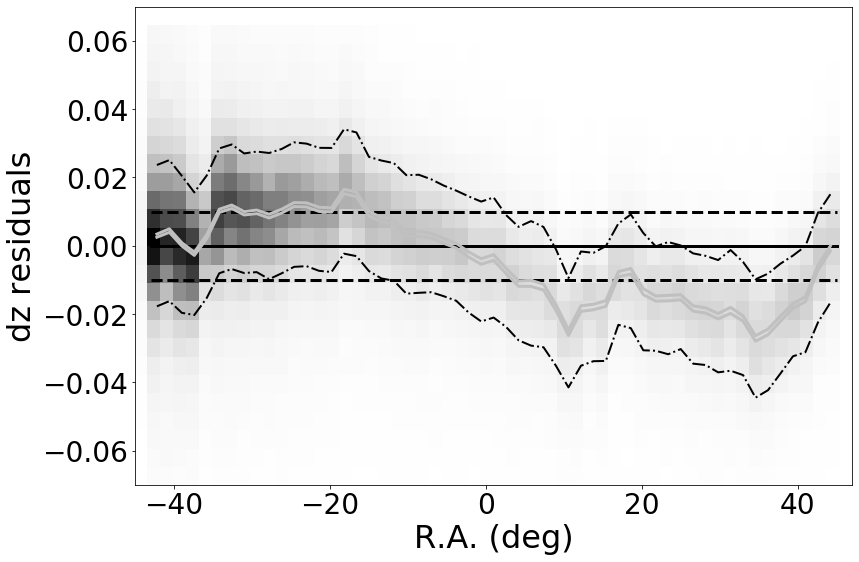

made plot colorResidDES42_dz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.5792999996204482e-06 std.dev.All: 0.023282698093200715
N= 552501 min= -0.2997165936999991 max= 0.29992520999999783
median: 0.00076444669999838 std.dev: 0.004793390038132324
saved plot as: colorResidDES42_dz_Dec.png


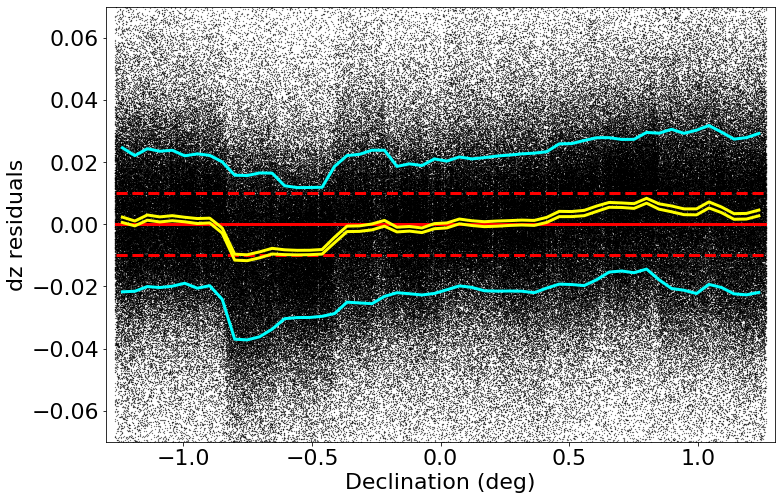

made plot colorResidDES42_dz_Dec.png
medianAll: -1.5792999996204482e-06 std.dev.All: 0.023282698093200715
N= 552501 min= -0.2997165936999991 max= 0.29992520999999783
median: 0.0009423370999999876 std.dev: 0.004798802723194896
saved plot as: colorResidDES42_dz_Dec_Hess.png


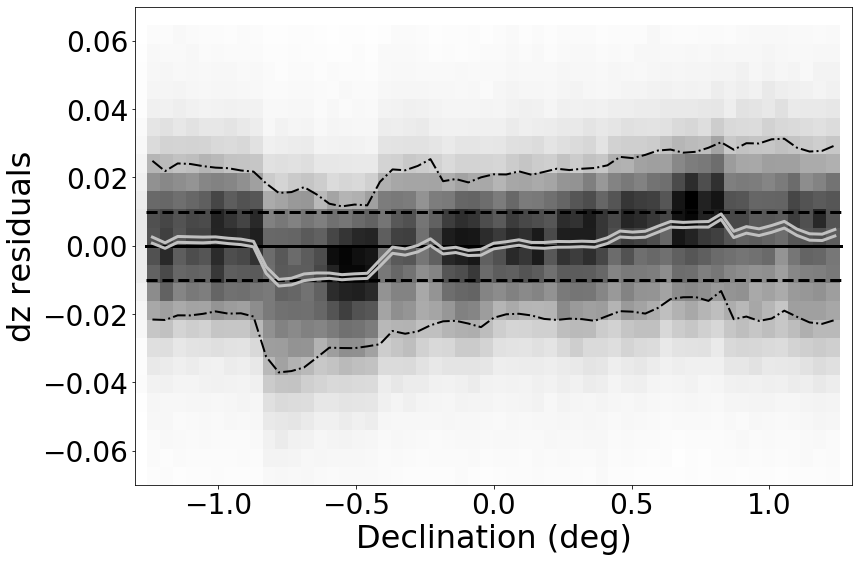

made plot colorResidDES42_dz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.5792999996204482e-06 std.dev.All: 0.023282698093200715
N= 552501 min= -0.2997165936999991 max= 0.29992520999999783
median: 0.0011875533999992378 std.dev: 0.004120098973913179
saved plot as: colorResidDES42_dz_rmag.png


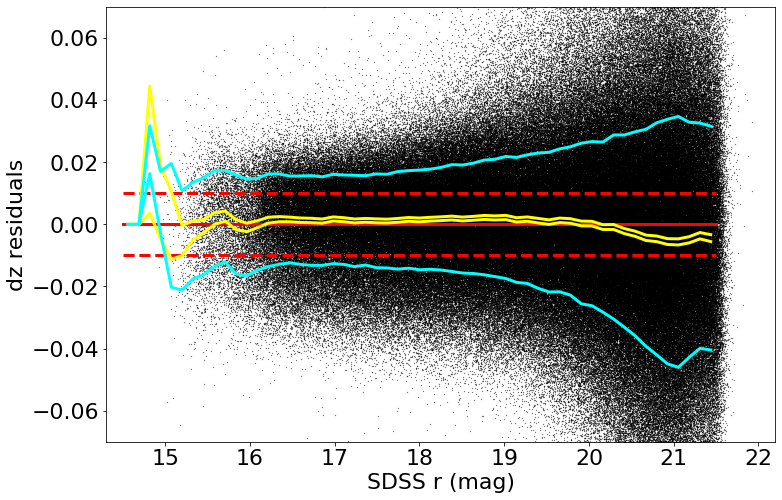

made plot colorResidDES42_dz_rmag.png
medianAll: -1.5792999996204482e-06 std.dev.All: 0.023282698093200715
N= 552501 min= -0.2997165936999991 max= 0.29992520999999783
median: 0.0011875533999992378 std.dev: 0.004120098973913179
saved plot as: colorResidDES42_dz_rmag_Hess.png


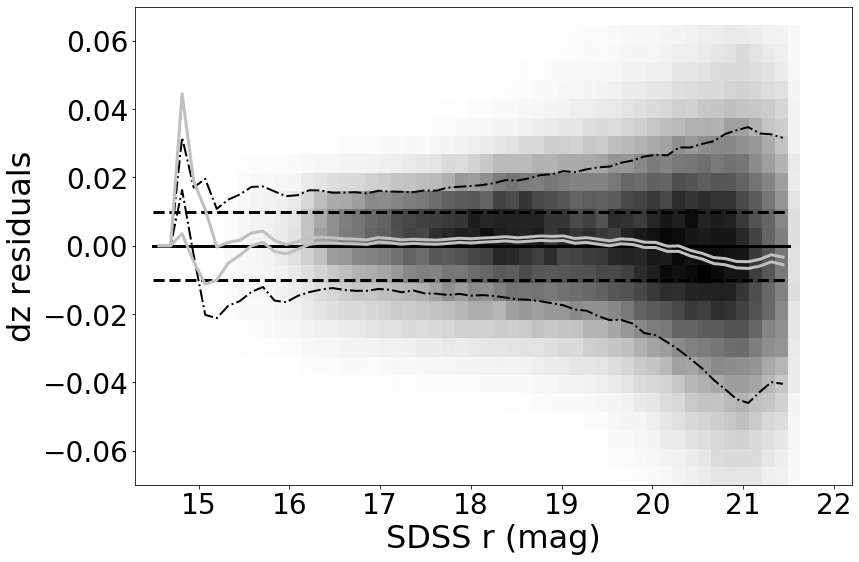

made plot colorResidDES42_dz_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: -3.968599999999364e-06 std.dev.All: 0.023251620423523238
N= 552424 min= -0.2993224734000032 max= 0.2998930288000009
median: 0.0005114865749990486 std.dev: 0.0055887456756871555
saved plot as: colorResidDES42_dgr_RA.png


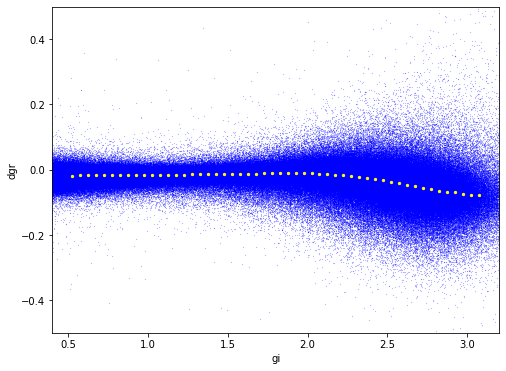

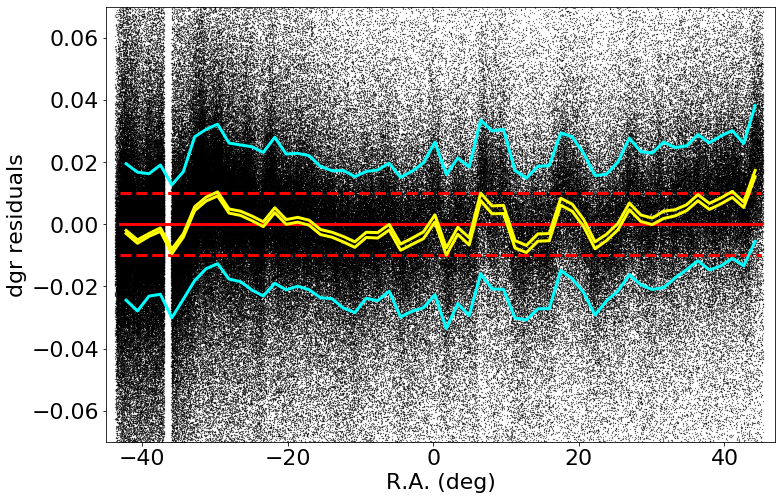

made plot colorResidDES42_dgr_RA.png
medianAll: -3.968599999999364e-06 std.dev.All: 0.023251620423523238
N= 552424 min= -0.2993224734000032 max= 0.2998930288000009
median: -0.00038892200000048907 std.dev: 0.005391752104738866
saved plot as: colorResidDES42_dgr_RA_Hess.png


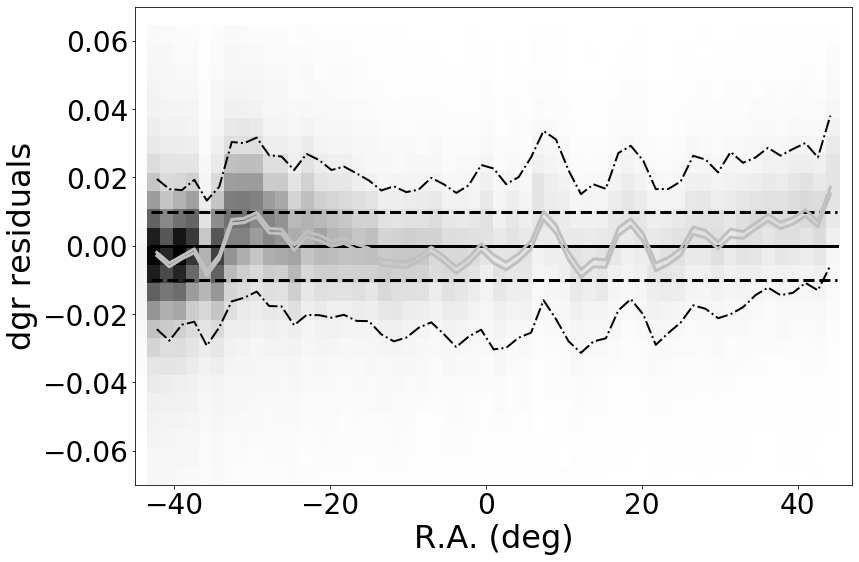

made plot colorResidDES42_dgr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -3.968599999999364e-06 std.dev.All: 0.023251620423523238
N= 552424 min= -0.2993224734000032 max= 0.2998930288000009
median: 0.000379268900001244 std.dev: 0.001920606811982431
saved plot as: colorResidDES42_dgr_Dec.png


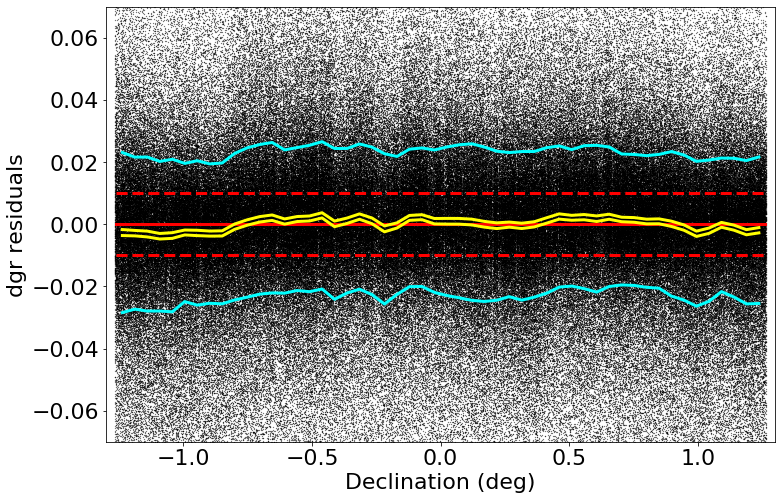

made plot colorResidDES42_dgr_Dec.png
medianAll: -3.968599999999364e-06 std.dev.All: 0.023251620423523238
N= 552424 min= -0.2993224734000032 max= 0.2998930288000009
median: 0.0003880462000042679 std.dev: 0.0019303020170507463
saved plot as: colorResidDES42_dgr_Dec_Hess.png


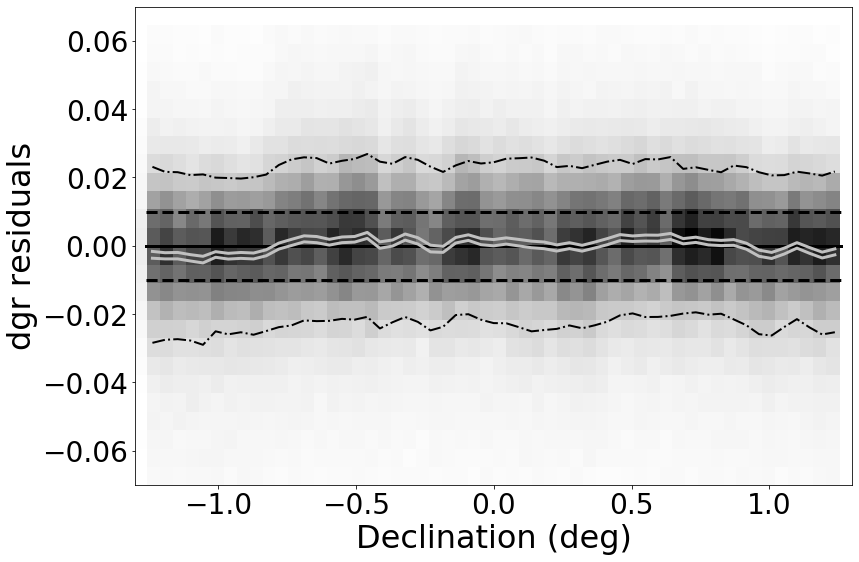

made plot colorResidDES42_dgr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -3.968599999999364e-06 std.dev.All: 0.023251620423523238
N= 552424 min= -0.2993224734000032 max= 0.2998930288000009
median: 0.002175574999998091 std.dev: 0.00865235935175166
saved plot as: colorResidDES42_dgr_rmag.png


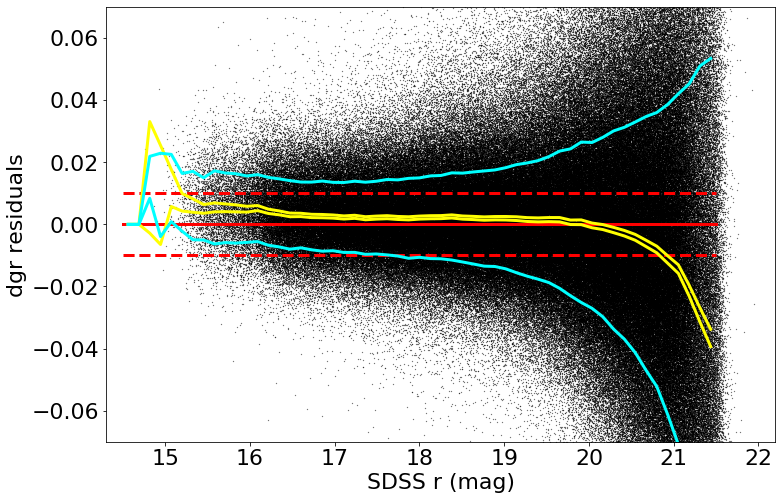

made plot colorResidDES42_dgr_rmag.png
medianAll: -3.968599999999364e-06 std.dev.All: 0.023251620423523238
N= 552424 min= -0.2993224734000032 max= 0.2998930288000009
median: 0.002175574999998091 std.dev: 0.00865235935175166
saved plot as: colorResidDES42_dgr_rmag_Hess.png


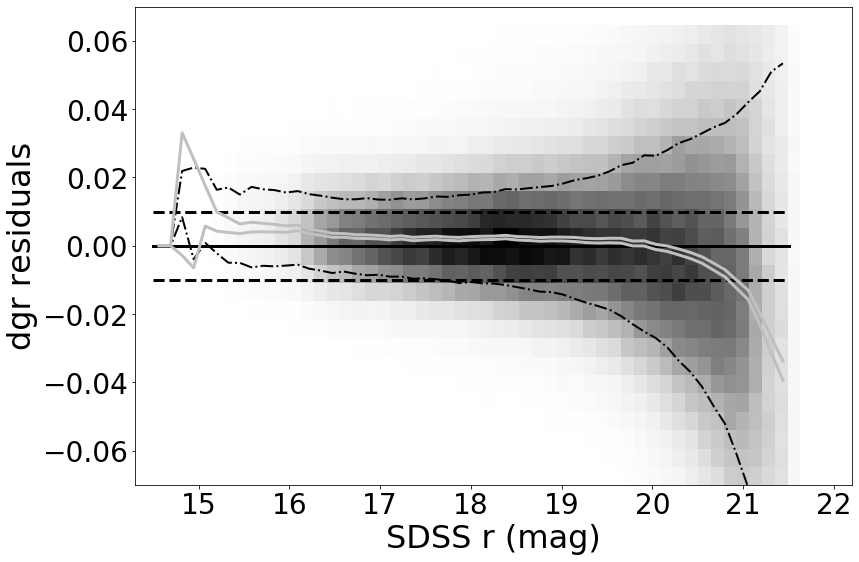

made plot colorResidDES42_dgr_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -8.72739999781269e-06 std.dev.All: 0.016020881346600756
N= 552841 min= -0.28841068750000126 max= 0.2985661035000004
median: 0.002118050649998249 std.dev: 0.004644095311262585
saved plot as: colorResidDES42_dri_RA.png


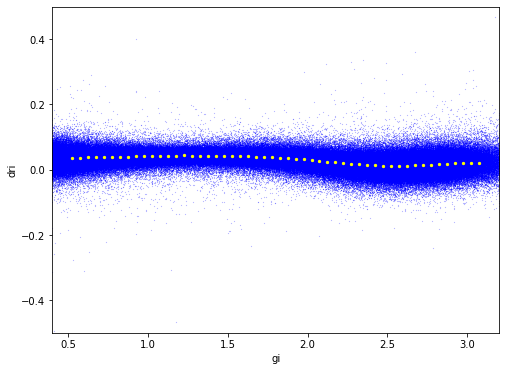

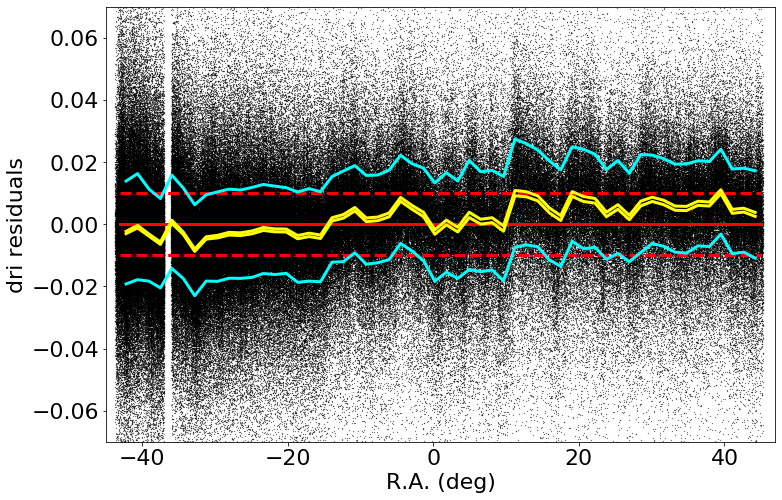

made plot colorResidDES42_dri_RA.png
medianAll: -8.72739999781269e-06 std.dev.All: 0.016020881346600756
N= 552841 min= -0.28841068750000126 max= 0.2985661035000004
median: 0.002303851900000462 std.dev: 0.004620992175227285
saved plot as: colorResidDES42_dri_RA_Hess.png


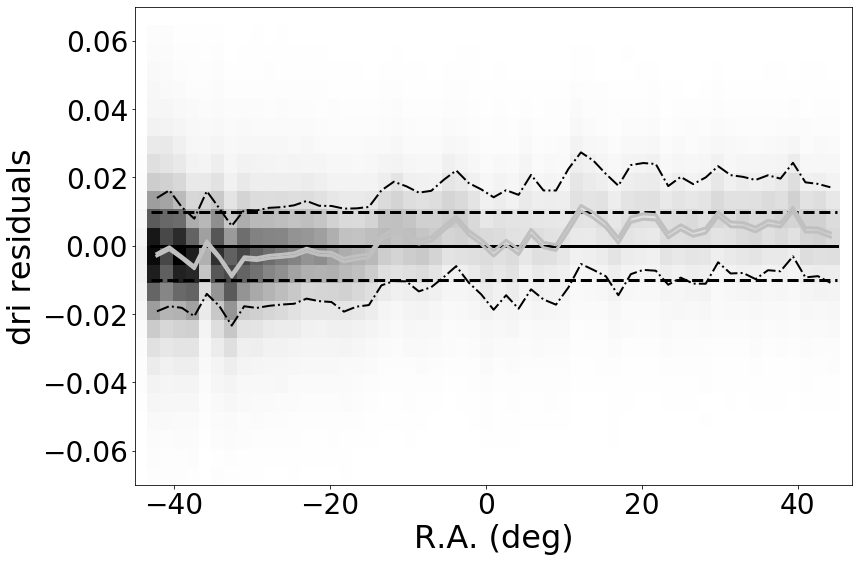

made plot colorResidDES42_dri_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -8.72739999781269e-06 std.dev.All: 0.016020881346600756
N= 552841 min= -0.28841068750000126 max= 0.2985661035000004
median: 0.00032570377500186834 std.dev: 0.0013852968459842283
saved plot as: colorResidDES42_dri_Dec.png


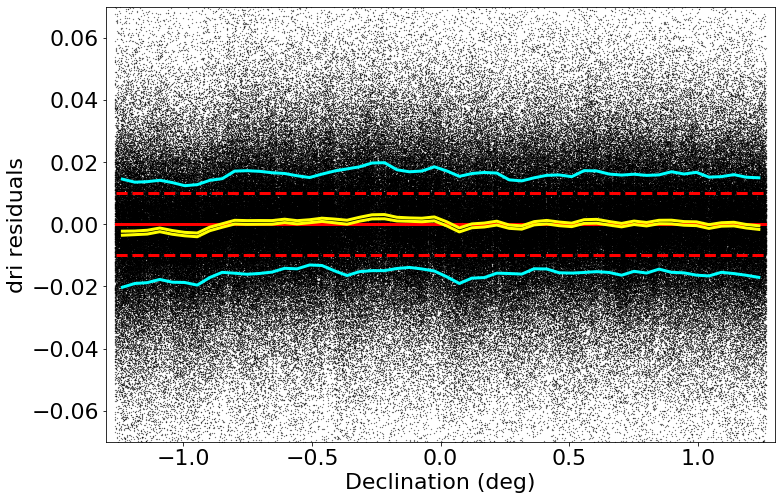

made plot colorResidDES42_dri_Dec.png
medianAll: -8.72739999781269e-06 std.dev.All: 0.016020881346600756
N= 552841 min= -0.28841068750000126 max= 0.2985661035000004
median: 0.00031908635000135743 std.dev: 0.001411768028494517
saved plot as: colorResidDES42_dri_Dec_Hess.png


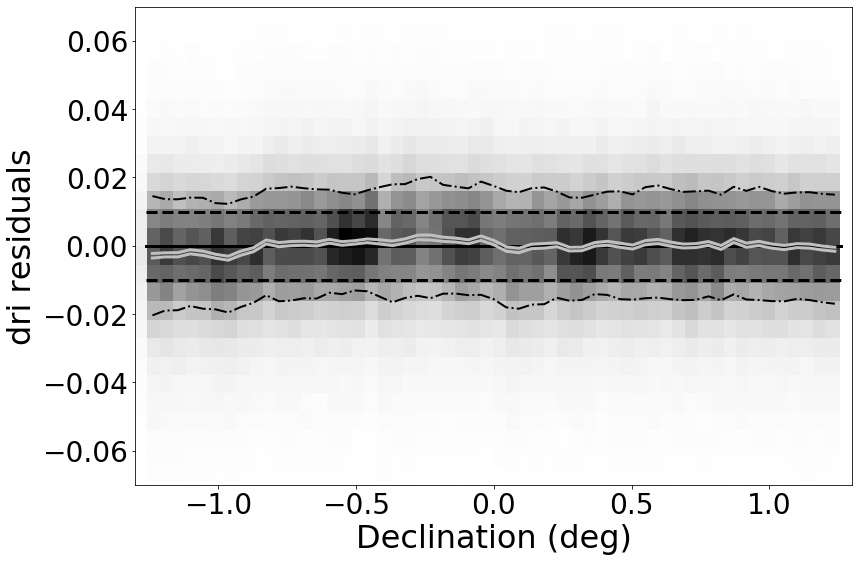

made plot colorResidDES42_dri_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -8.72739999781269e-06 std.dev.All: 0.016020881346600756
N= 552841 min= -0.28841068750000126 max= 0.2985661035000004
median: -0.00016035579999856484 std.dev: 0.0021057950653834523
saved plot as: colorResidDES42_dri_rmag.png


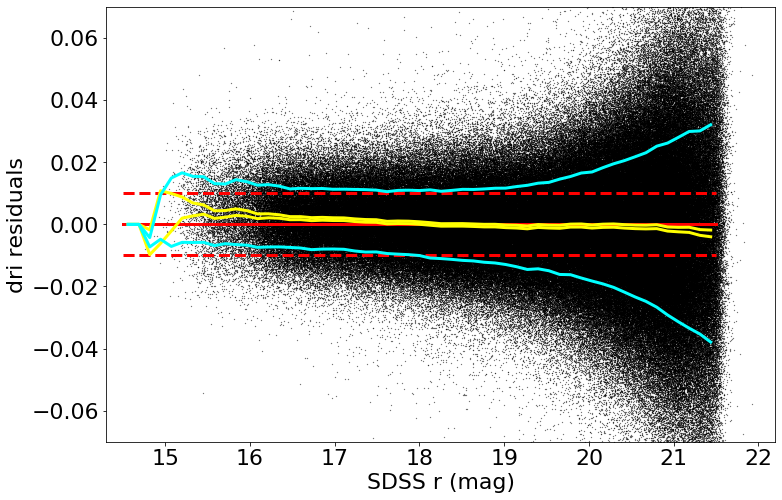

made plot colorResidDES42_dri_rmag.png
medianAll: -8.72739999781269e-06 std.dev.All: 0.016020881346600756
N= 552841 min= -0.28841068750000126 max= 0.2985661035000004
median: -0.00016035579999856484 std.dev: 0.0021057950653834523
saved plot as: colorResidDES42_dri_rmag_Hess.png


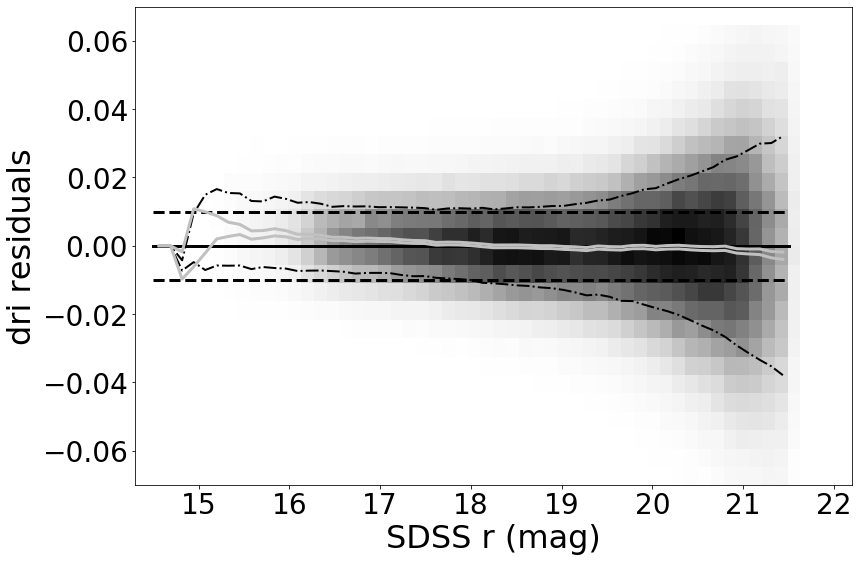

made plot colorResidDES42_dri_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: -7.529799998934328e-06 std.dev.All: 0.021891003948452045
N= 552666 min= -0.2996546649999994 max= 0.29988349739999914
median: -0.0009857873999996672 std.dev: 0.008386509436924896
saved plot as: colorResidDES42_diz_RA.png


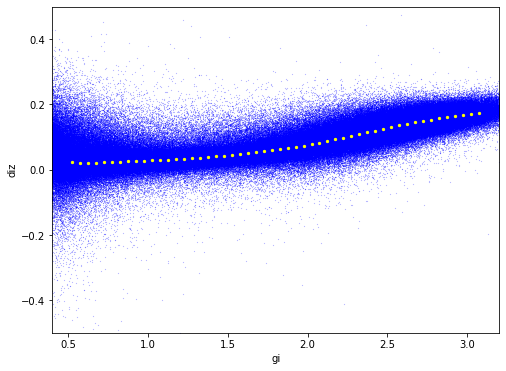

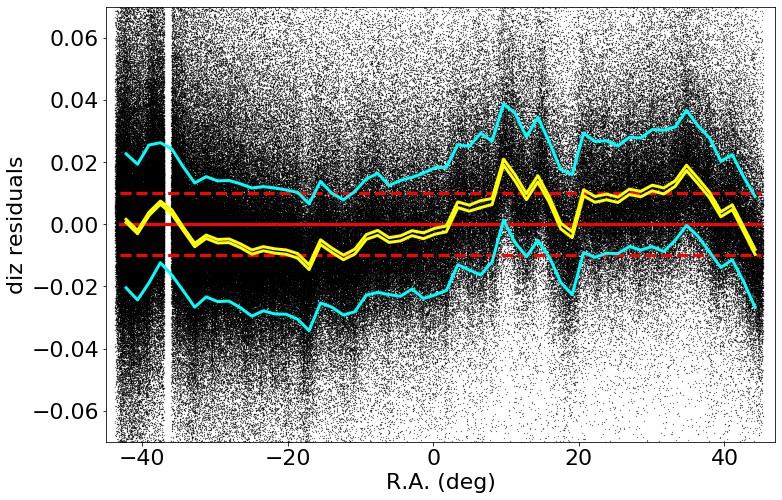

made plot colorResidDES42_diz_RA.png
medianAll: -7.529799998934328e-06 std.dev.All: 0.021891003948452045
N= 552666 min= -0.2996546649999994 max= 0.29988349739999914
median: 0.0010952245000028747 std.dev: 0.008327192015371729
saved plot as: colorResidDES42_diz_RA_Hess.png


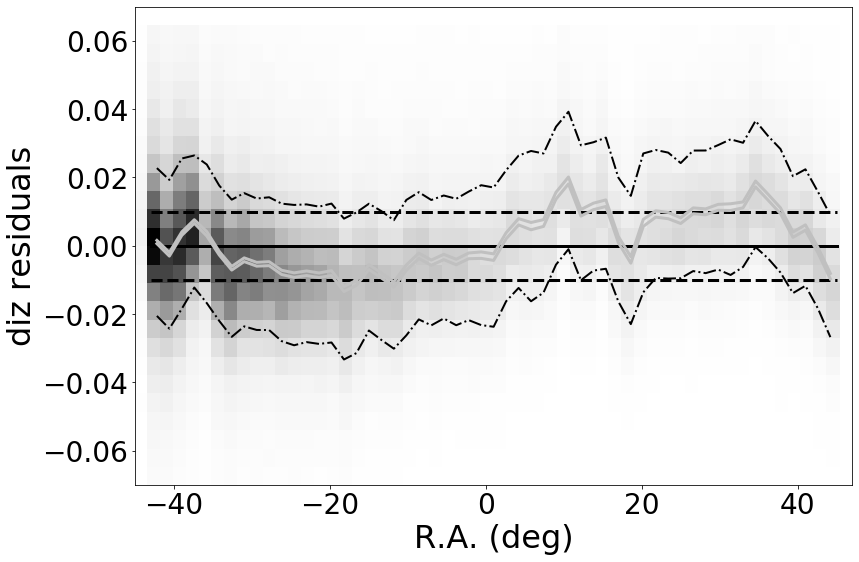

made plot colorResidDES42_diz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -7.529799998934328e-06 std.dev.All: 0.021891003948452045
N= 552666 min= -0.2996546649999994 max= 0.29988349739999914
median: -0.0003177011500002389 std.dev: 0.003510772496237472
saved plot as: colorResidDES42_diz_Dec.png


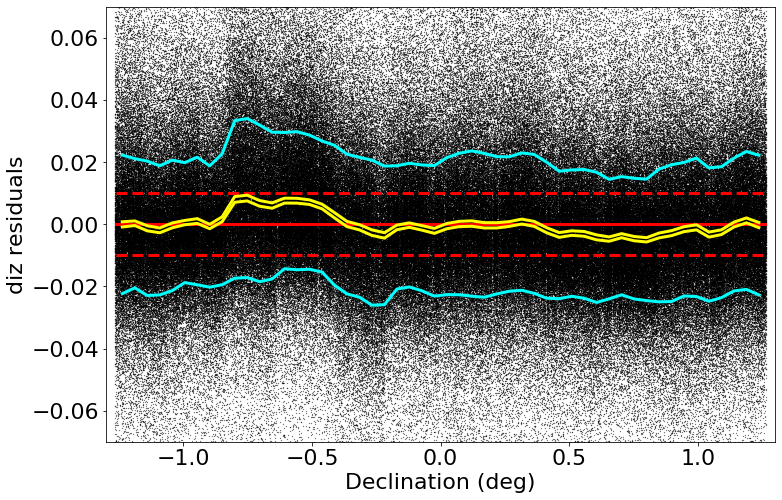

made plot colorResidDES42_diz_Dec.png
medianAll: -7.529799998934328e-06 std.dev.All: 0.021891003948452045
N= 552666 min= -0.2996546649999994 max= 0.29988349739999914
median: -0.0004048244000033549 std.dev: 0.003516171486664064
saved plot as: colorResidDES42_diz_Dec_Hess.png


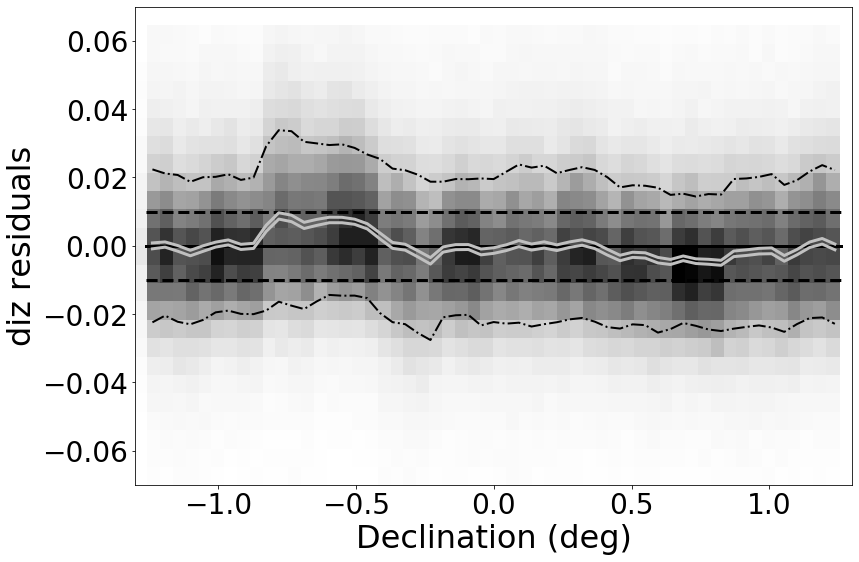

made plot colorResidDES42_diz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -7.529799998934328e-06 std.dev.All: 0.021891003948452045
N= 552666 min= -0.2996546649999994 max= 0.29988349739999914
median: -0.002326387999996654 std.dev: 0.006297880105791182
saved plot as: colorResidDES42_diz_rmag.png


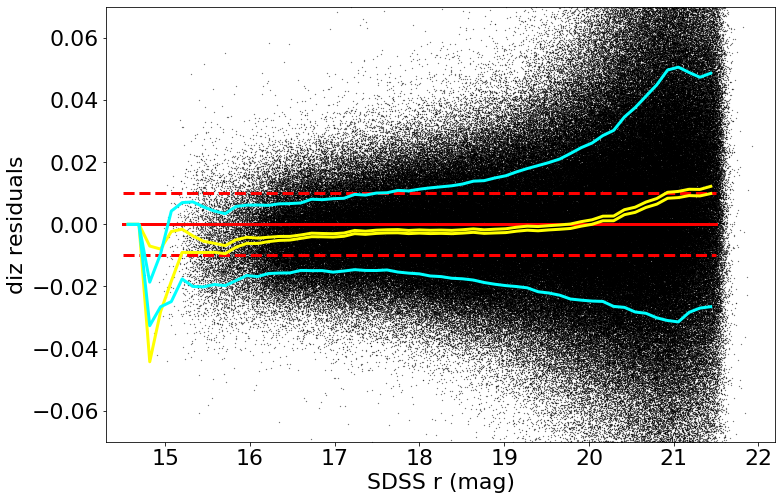

made plot colorResidDES42_diz_rmag.png
medianAll: -7.529799998934328e-06 std.dev.All: 0.021891003948452045
N= 552666 min= -0.2996546649999994 max= 0.29988349739999914
median: -0.002326387999996654 std.dev: 0.006297880105791182
saved plot as: colorResidDES42_diz_rmag_Hess.png


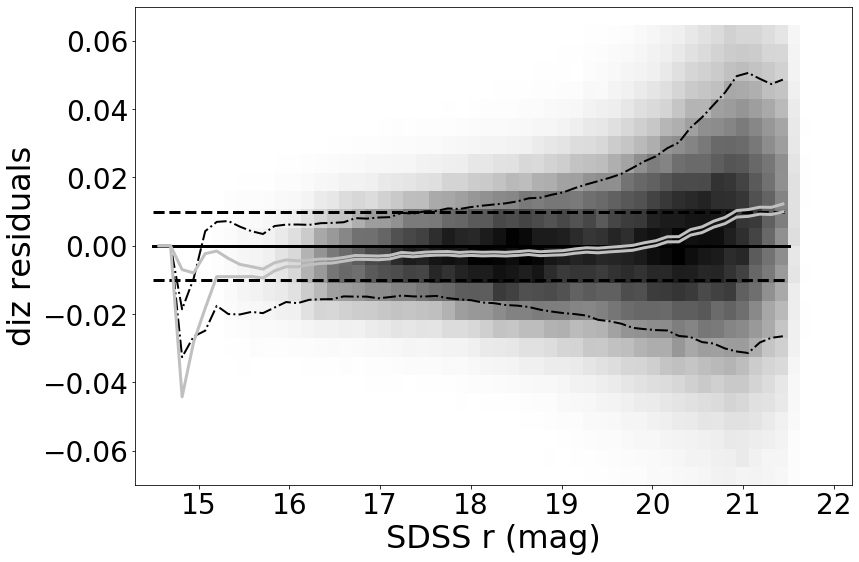

made plot colorResidDES42_diz_rmag_Hess.png
------------------------------------------------------------------


In [23]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidDES42_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssDES, keywords)

=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -1.1831200000093217e-05 std.dev.All: 0.012559714436099623
N= 302661 min= -0.28091861729999745 max= 0.2977689699999999
median: -0.0003225000749999844 std.dev: 0.004890965930103508
saved plot as: colorResidDES42bright_dg_RA.png


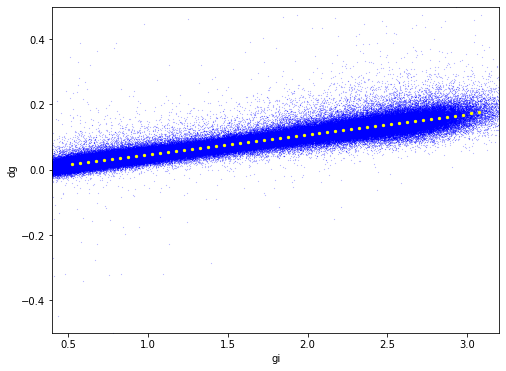

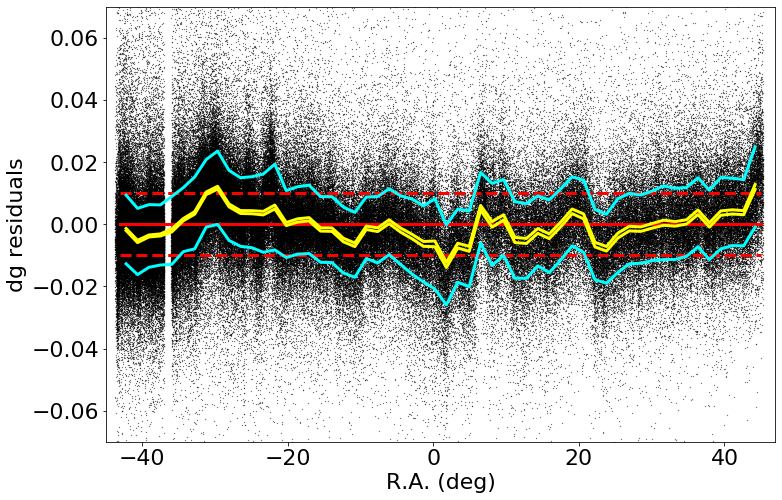

made plot colorResidDES42bright_dg_RA.png
medianAll: -1.1831200000093217e-05 std.dev.All: 0.012559714436099623
N= 302661 min= -0.28091861729999745 max= 0.2977689699999999
median: -0.0004798099999998584 std.dev: 0.004817606387405139
saved plot as: colorResidDES42bright_dg_RA_Hess.png


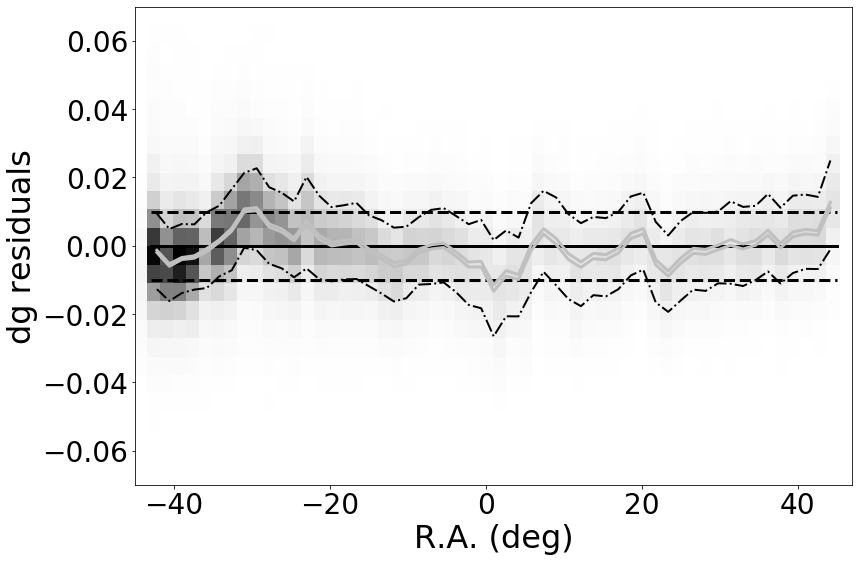

made plot colorResidDES42bright_dg_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.1831200000093217e-05 std.dev.All: 0.012559714436099623
N= 302661 min= -0.28091861729999745 max= 0.2977689699999999
median: 0.0004138330499981989 std.dev: 0.0020180593961314944
saved plot as: colorResidDES42bright_dg_Dec.png


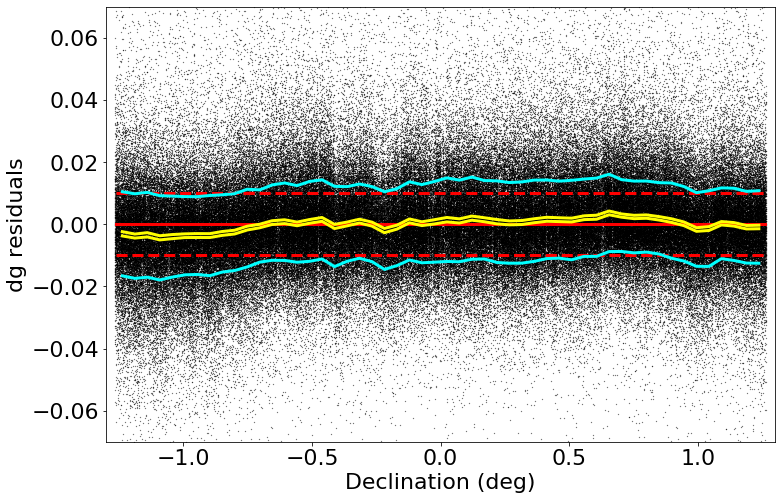

made plot colorResidDES42bright_dg_Dec.png
medianAll: -1.1831200000093217e-05 std.dev.All: 0.012559714436099623
N= 302661 min= -0.28091861729999745 max= 0.2977689699999999
median: 0.0004705439999989104 std.dev: 0.0020364371790286113
saved plot as: colorResidDES42bright_dg_Dec_Hess.png


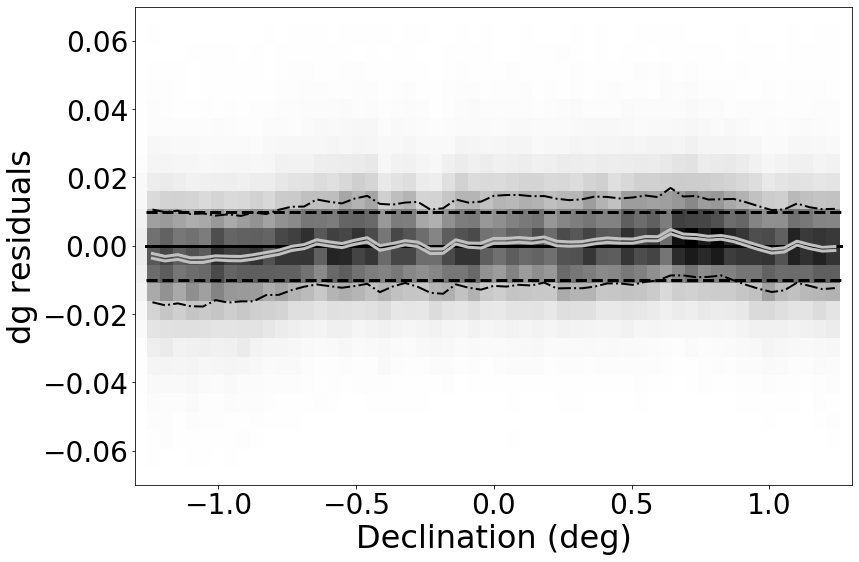

made plot colorResidDES42bright_dg_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.1831200000093217e-05 std.dev.All: 0.012559714436099623
N= 302661 min= -0.28091861729999745 max= 0.2977689699999999
median: 9.694000005951164e-07 std.dev: 0.0015248645082486982
saved plot as: colorResidDES42bright_dg_rmag.png


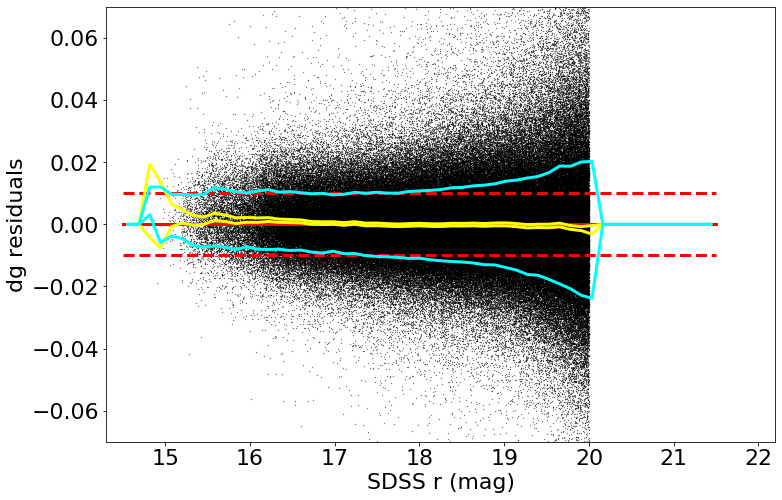

made plot colorResidDES42bright_dg_rmag.png
medianAll: -1.1831200000093217e-05 std.dev.All: 0.012559714436099623
N= 302661 min= -0.28091861729999745 max= 0.2977689699999999
median: 9.694000005951164e-07 std.dev: 0.0015248645082486982
saved plot as: colorResidDES42bright_dg_rmag_Hess.png


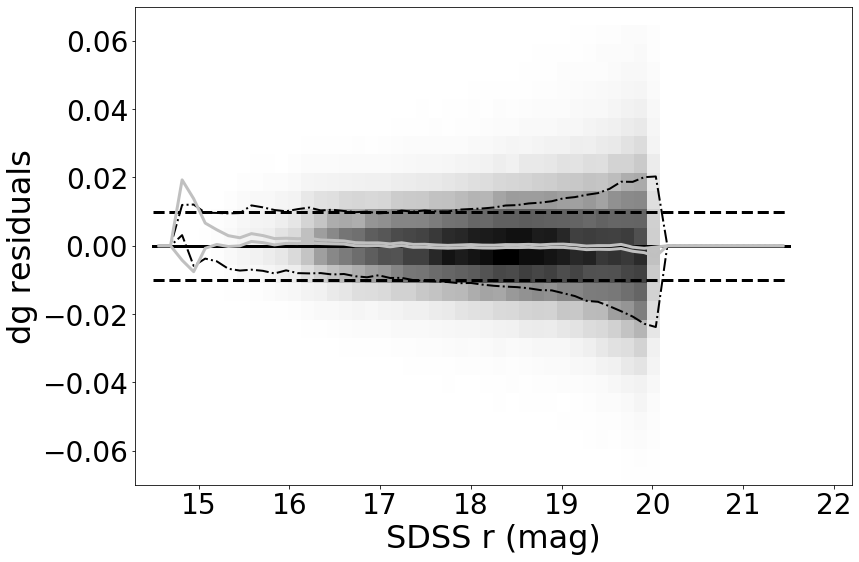

made plot colorResidDES42bright_dg_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: 2.010899998641791e-06 std.dev.All: 0.009631918918051489
N= 302695 min= -0.29686983999999755 max= 0.29695806049999723
median: -0.00021034777500094845 std.dev: 0.003253933986906037
saved plot as: colorResidDES42bright_dr_RA.png


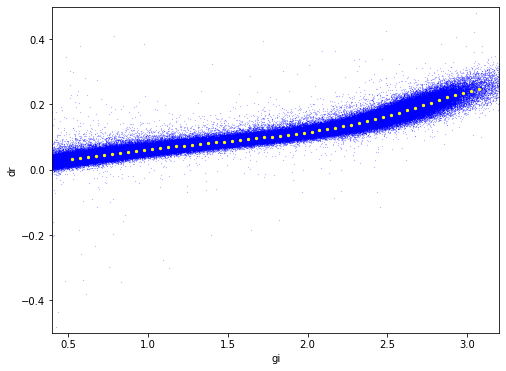

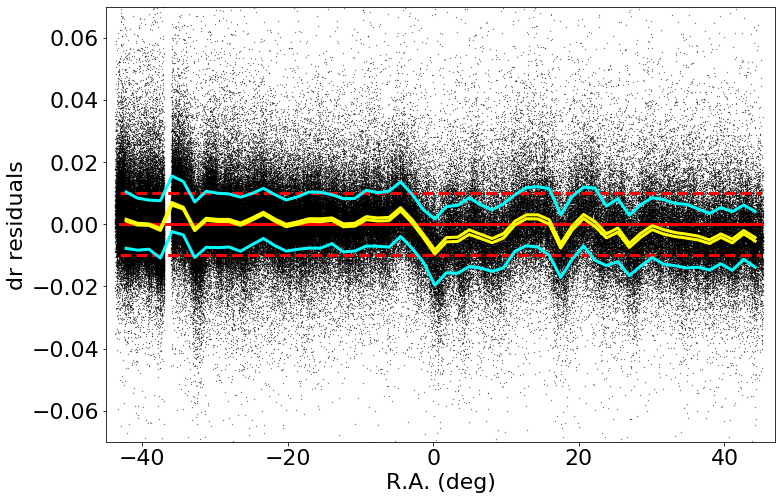

made plot colorResidDES42bright_dr_RA.png
medianAll: 2.010899998641791e-06 std.dev.All: 0.009631918918051489
N= 302695 min= -0.29686983999999755 max= 0.29695806049999723
median: -0.0003120000000013945 std.dev: 0.0033009851474392607
saved plot as: colorResidDES42bright_dr_RA_Hess.png


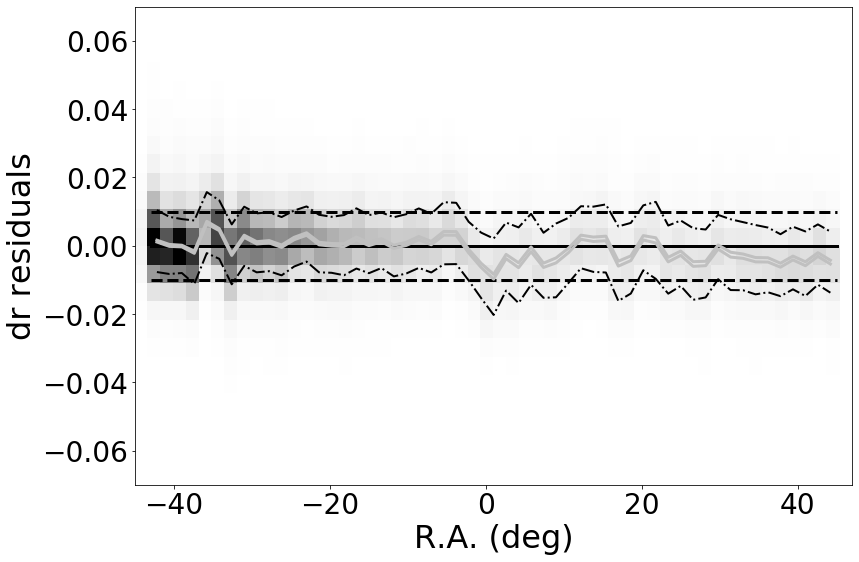

made plot colorResidDES42bright_dr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 2.010899998641791e-06 std.dev.All: 0.009631918918051489
N= 302695 min= -0.29686983999999755 max= 0.29695806049999723
median: 8.03162000010283e-05 std.dev: 0.0008990508095436375
saved plot as: colorResidDES42bright_dr_Dec.png


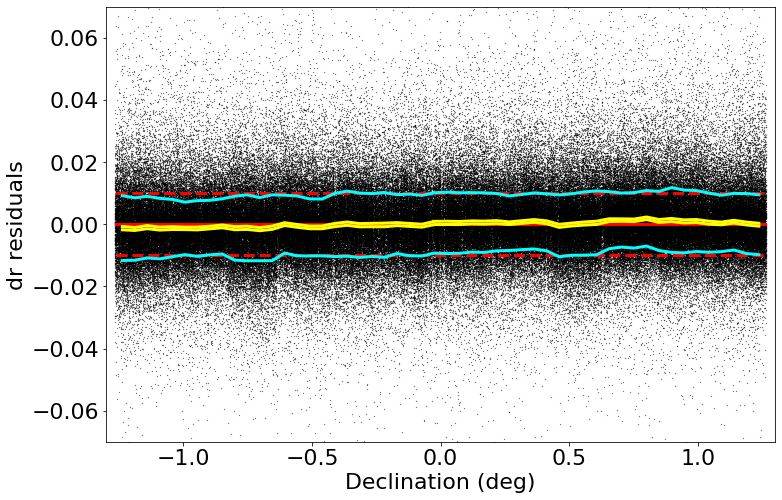

made plot colorResidDES42bright_dr_Dec.png
medianAll: 2.010899998641791e-06 std.dev.All: 0.009631918918051489
N= 302695 min= -0.29686983999999755 max= 0.29695806049999723
median: 9.685800000248934e-05 std.dev: 0.0009010261284961859
saved plot as: colorResidDES42bright_dr_Dec_Hess.png


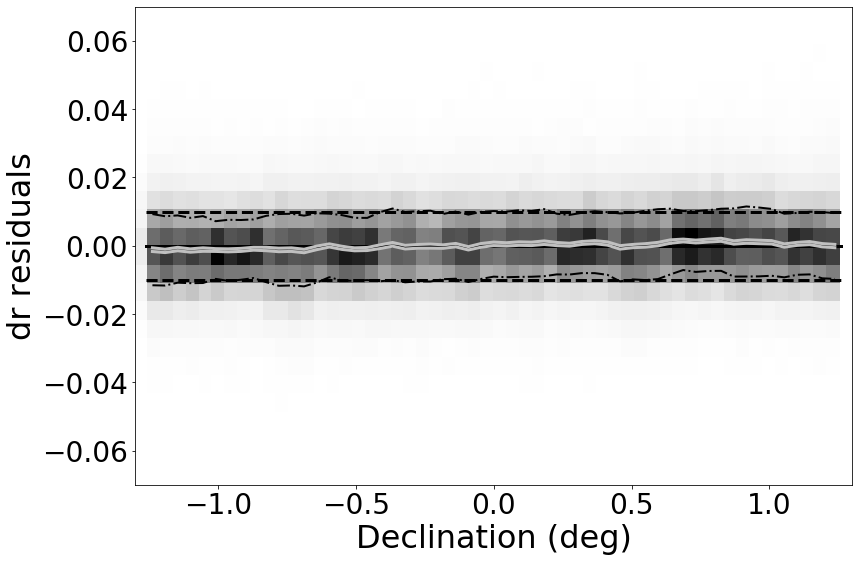

made plot colorResidDES42bright_dr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 2.010899998641791e-06 std.dev.All: 0.009631918918051489
N= 302695 min= -0.29686983999999755 max= 0.29695806049999723
median: -0.0005271894999973742 std.dev: 0.002433227850423126
saved plot as: colorResidDES42bright_dr_rmag.png


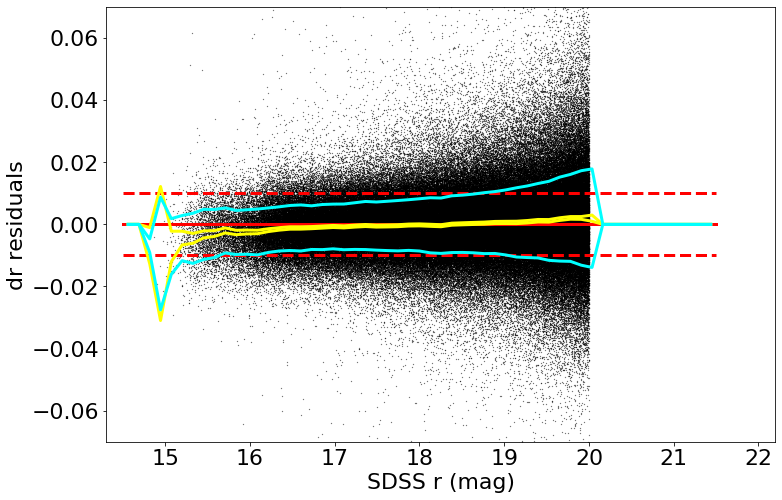

made plot colorResidDES42bright_dr_rmag.png
medianAll: 2.010899998641791e-06 std.dev.All: 0.009631918918051489
N= 302695 min= -0.29686983999999755 max= 0.29695806049999723
median: -0.0005271894999973742 std.dev: 0.002433227850423126
saved plot as: colorResidDES42bright_dr_rmag_Hess.png


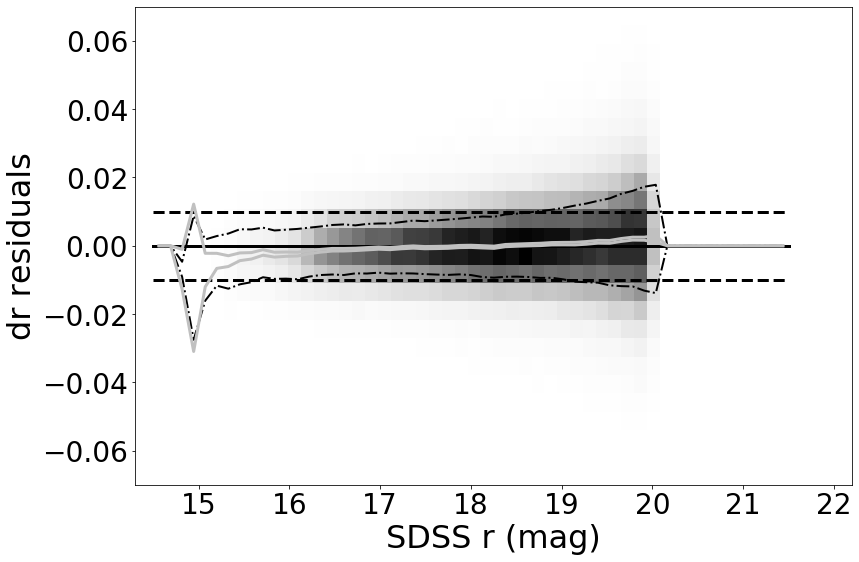

made plot colorResidDES42bright_dr_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: -1.0224000001288333e-05 std.dev.All: 0.011605466862603246
N= 302700 min= -0.2958314956000011 max= 0.2790941877999981
median: -0.0050389698999997855 std.dev: 0.005948716710030688
saved plot as: colorResidDES42bright_di_RA.png


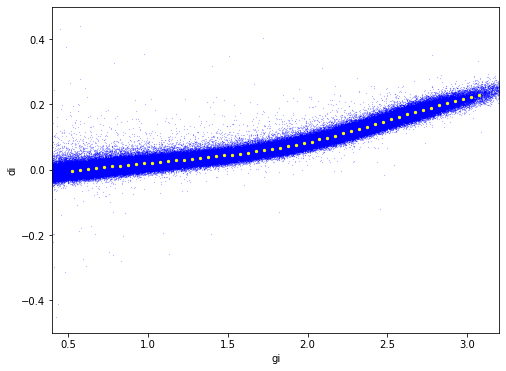

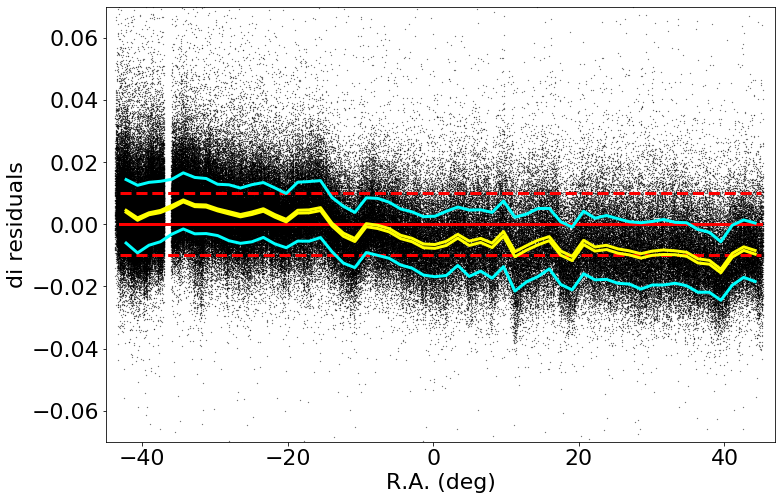

made plot colorResidDES42bright_di_RA.png
medianAll: -1.0224000001288333e-05 std.dev.All: 0.011605466862603246
N= 302700 min= -0.2958314956000011 max= 0.2790941877999981
median: -0.004737754000002765 std.dev: 0.00592117283789224
saved plot as: colorResidDES42bright_di_RA_Hess.png


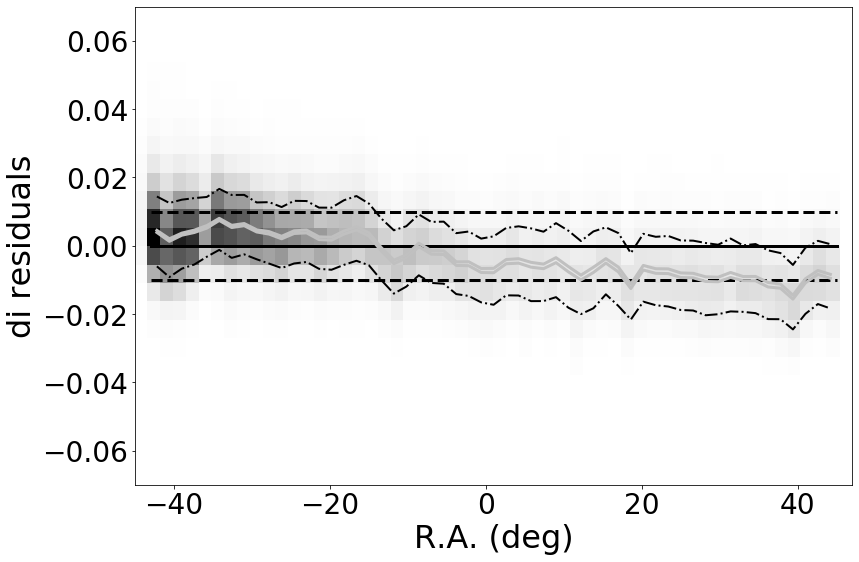

made plot colorResidDES42bright_di_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.0224000001288333e-05 std.dev.All: 0.011605466862603246
N= 302700 min= -0.2958314956000011 max= 0.2790941877999981
median: 0.000120708524999894 std.dev: 0.001371072509961869
saved plot as: colorResidDES42bright_di_Dec.png


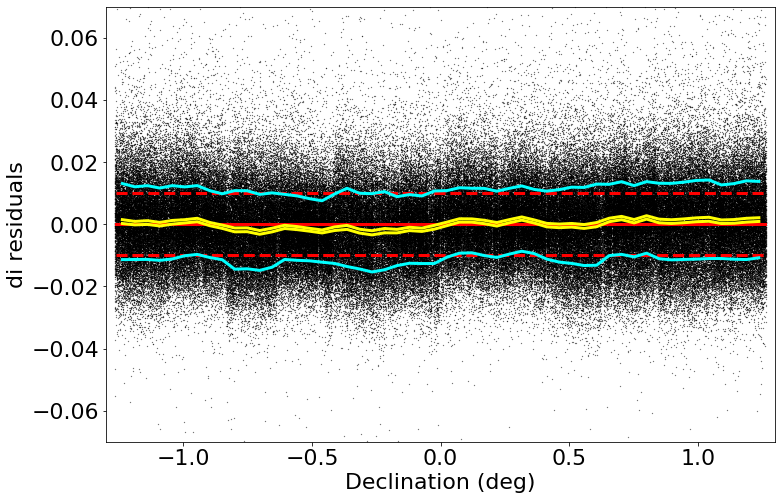

made plot colorResidDES42bright_di_Dec.png
medianAll: -1.0224000001288333e-05 std.dev.All: 0.011605466862603246
N= 302700 min= -0.2958314956000011 max= 0.2790941877999981
median: 2.703600000169247e-05 std.dev: 0.0014188589136267275
saved plot as: colorResidDES42bright_di_Dec_Hess.png


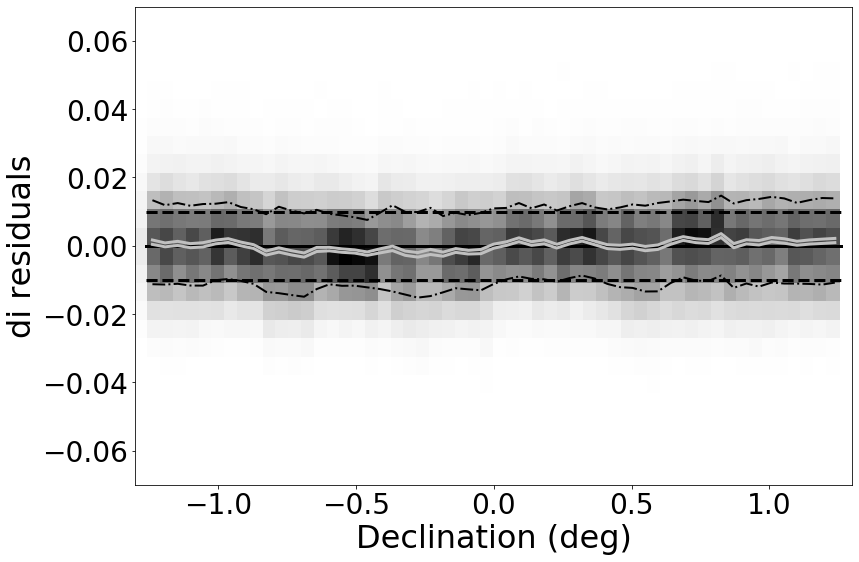

made plot colorResidDES42bright_di_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.0224000001288333e-05 std.dev.All: 0.011605466862603246
N= 302700 min= -0.2958314956000011 max= 0.2790941877999981
median: -0.001301826300000598 std.dev: 0.0039124769202772405
saved plot as: colorResidDES42bright_di_rmag.png


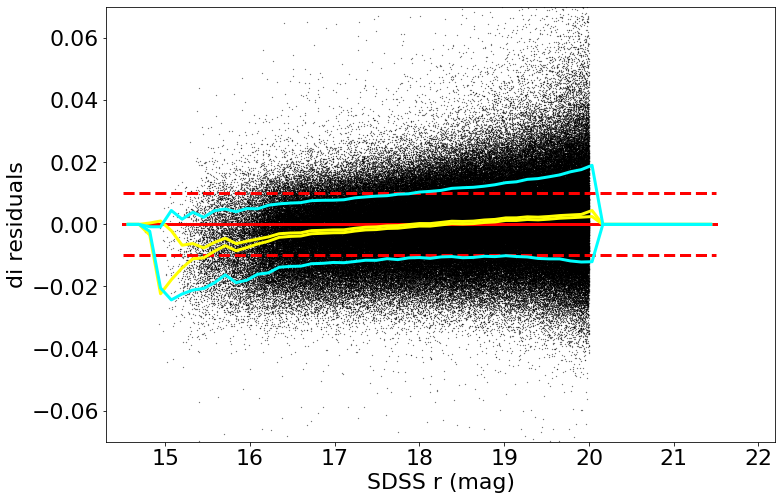

made plot colorResidDES42bright_di_rmag.png
medianAll: -1.0224000001288333e-05 std.dev.All: 0.011605466862603246
N= 302700 min= -0.2958314956000011 max= 0.2790941877999981
median: -0.001301826300000598 std.dev: 0.0039124769202772405
saved plot as: colorResidDES42bright_di_rmag_Hess.png


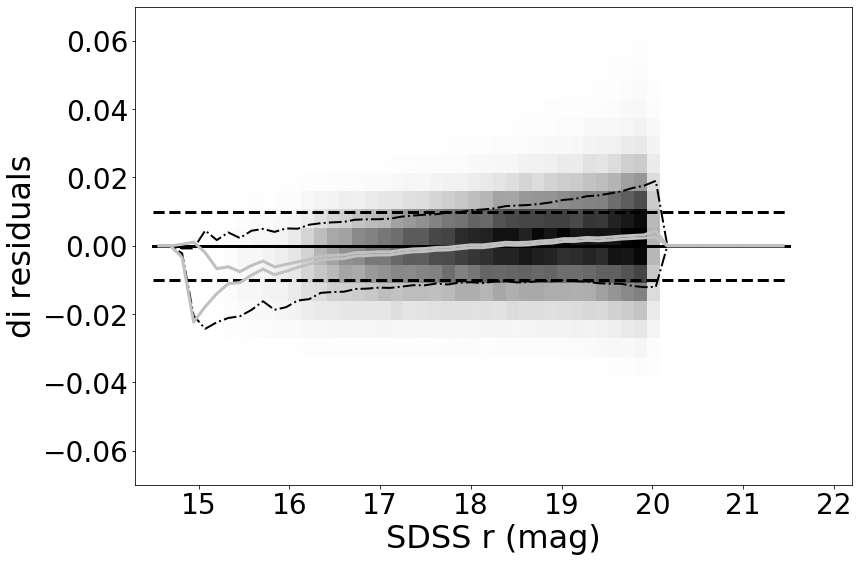

made plot colorResidDES42bright_di_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: -7.337899995706922e-06 std.dev.All: 0.01776532939349978
N= 302677 min= -0.28957528700000296 max= 0.29791279440000284
median: -0.004000917300000668 std.dev: 0.012151935951722346
saved plot as: colorResidDES42bright_dz_RA.png


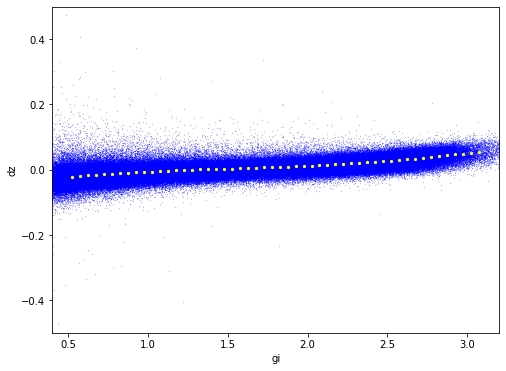

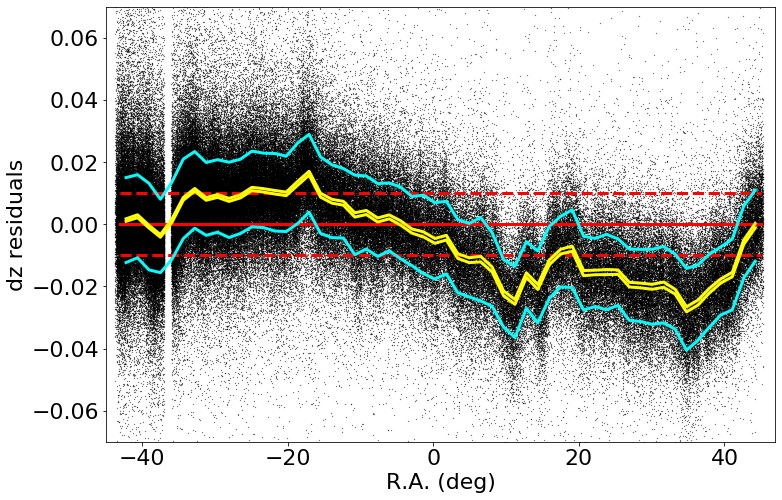

made plot colorResidDES42bright_dz_RA.png
medianAll: -7.337899995706922e-06 std.dev.All: 0.01776532939349978
N= 302677 min= -0.28957528700000296 max= 0.29791279440000284
median: -0.003774022799999022 std.dev: 0.012130096024648561
saved plot as: colorResidDES42bright_dz_RA_Hess.png


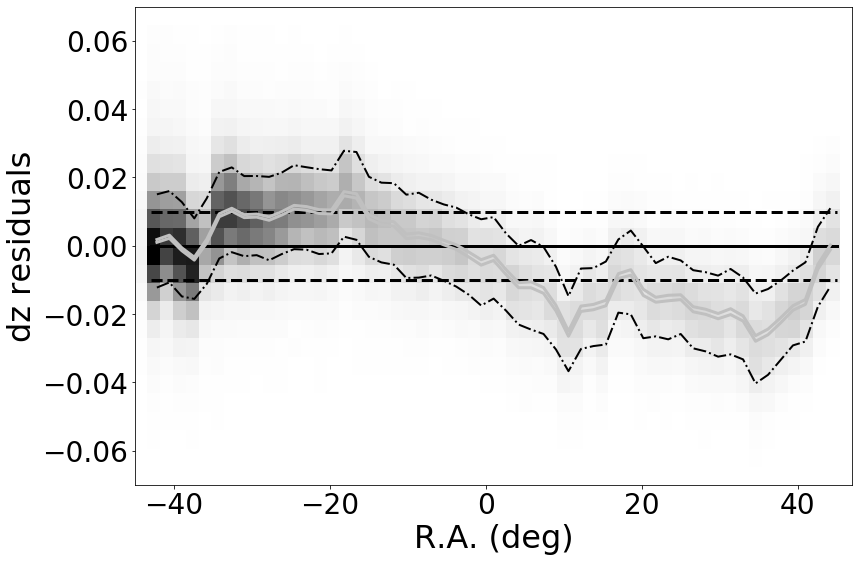

made plot colorResidDES42bright_dz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -7.337899995706922e-06 std.dev.All: 0.01776532939349978
N= 302677 min= -0.28957528700000296 max= 0.29791279440000284
median: 0.0005854115000007145 std.dev: 0.0035720239318762573
saved plot as: colorResidDES42bright_dz_Dec.png


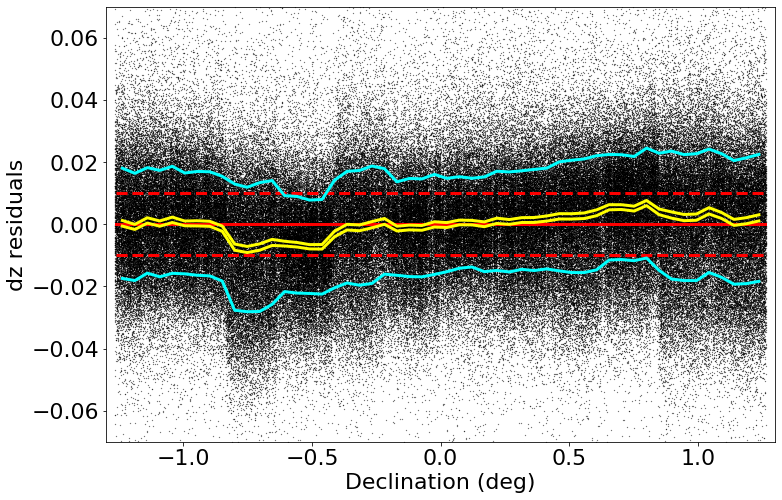

made plot colorResidDES42bright_dz_Dec.png
medianAll: -7.337899995706922e-06 std.dev.All: 0.01776532939349978
N= 302677 min= -0.28957528700000296 max= 0.29791279440000284
median: 0.0006475976999987991 std.dev: 0.003574455571564451
saved plot as: colorResidDES42bright_dz_Dec_Hess.png


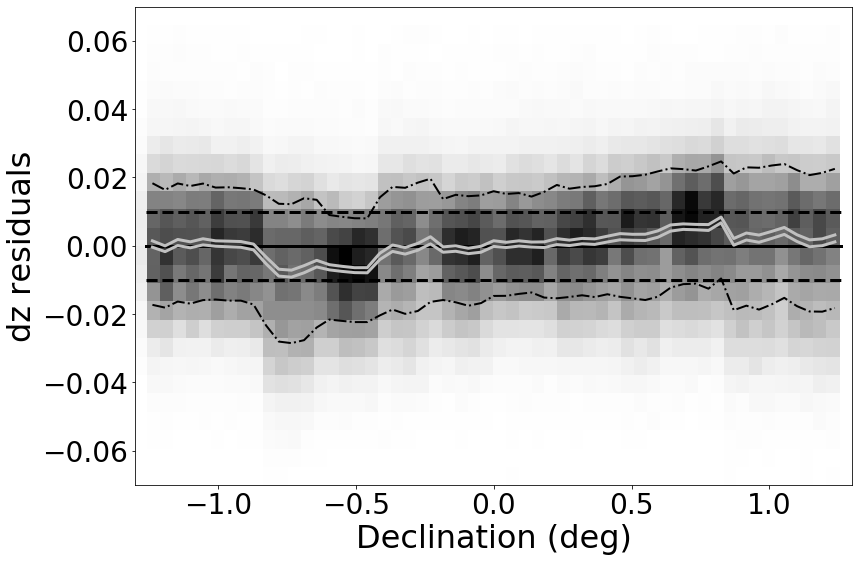

made plot colorResidDES42bright_dz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -7.337899995706922e-06 std.dev.All: 0.01776532939349978
N= 302677 min= -0.28957528700000296 max= 0.29791279440000284
median: -7.412129999944924e-05 std.dev: 0.0038815458067641235
saved plot as: colorResidDES42bright_dz_rmag.png


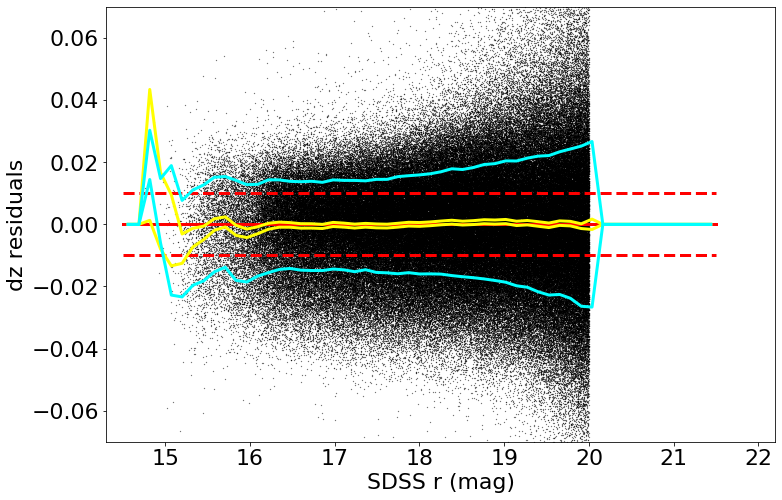

made plot colorResidDES42bright_dz_rmag.png
medianAll: -7.337899995706922e-06 std.dev.All: 0.01776532939349978
N= 302677 min= -0.28957528700000296 max= 0.29791279440000284
median: -7.412129999944924e-05 std.dev: 0.0038815458067641235
saved plot as: colorResidDES42bright_dz_rmag_Hess.png


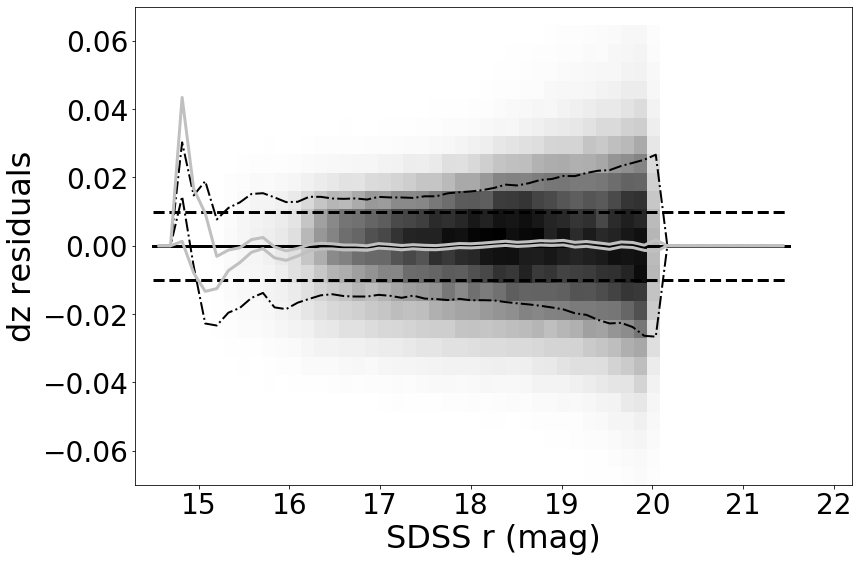

made plot colorResidDES42bright_dz_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: -3.990200001222771e-06 std.dev.All: 0.014764440431325196
N= 302690 min= -0.2867319485999978 max= 0.2927874595999974
median: 0.00018686949999985672 std.dev: 0.005495587223644996
saved plot as: colorResidDES42bright_dgr_RA.png


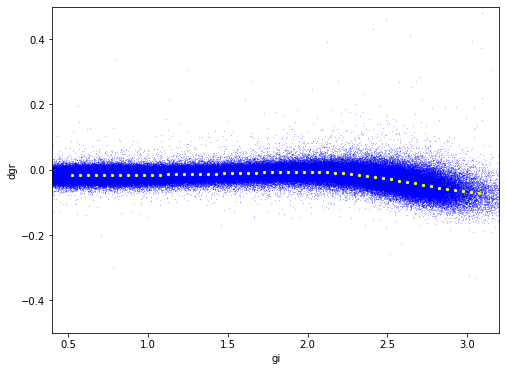

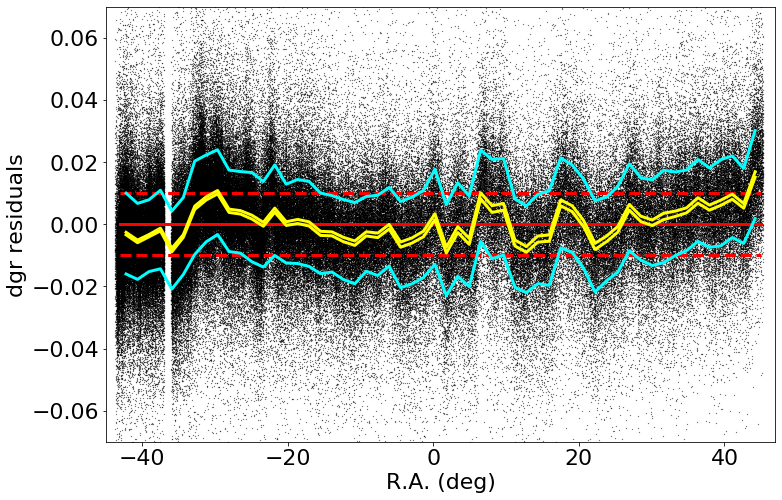

made plot colorResidDES42bright_dgr_RA.png
medianAll: -3.990200001222771e-06 std.dev.All: 0.014764440431325196
N= 302690 min= -0.2867319485999978 max= 0.2927874595999974
median: -0.00022128039999621402 std.dev: 0.005282579974849116
saved plot as: colorResidDES42bright_dgr_RA_Hess.png


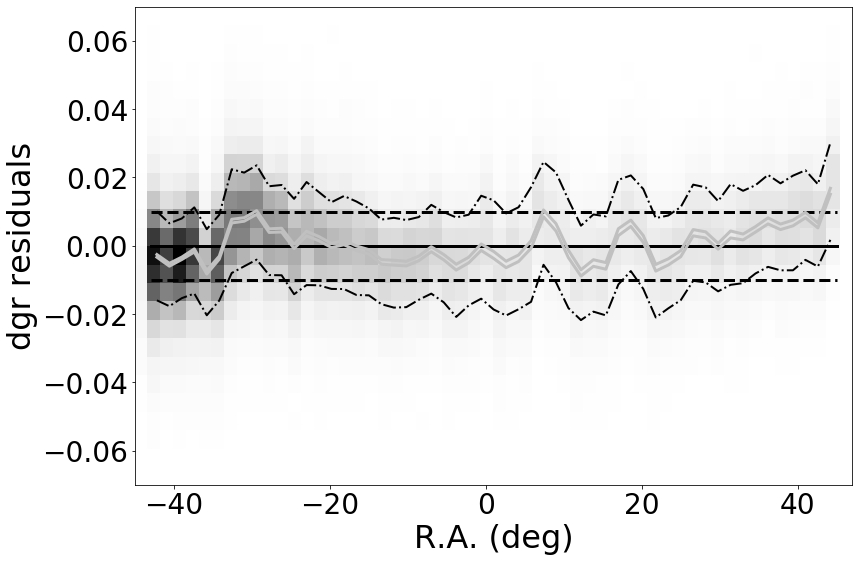

made plot colorResidDES42bright_dgr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -3.990200001222771e-06 std.dev.All: 0.014764440431325196
N= 302690 min= -0.2867319485999978 max= 0.2927874595999974
median: 0.0002311624499976325 std.dev: 0.0015922973074691121
saved plot as: colorResidDES42bright_dgr_Dec.png


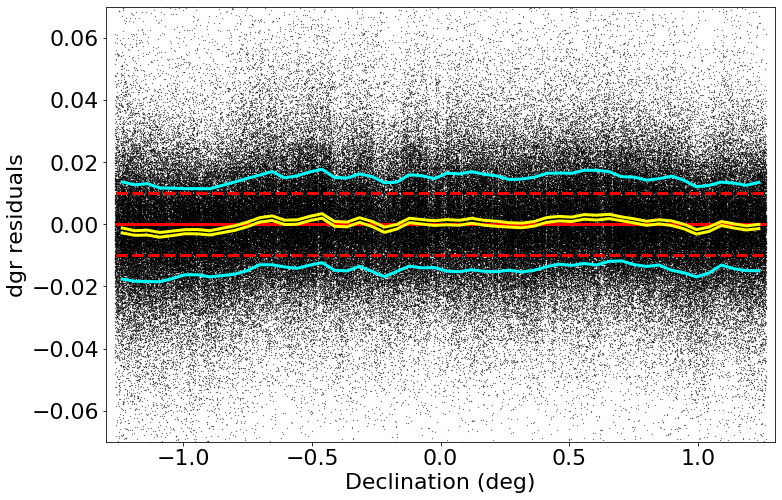

made plot colorResidDES42bright_dgr_Dec.png
medianAll: -3.990200001222771e-06 std.dev.All: 0.014764440431325196
N= 302690 min= -0.2867319485999978 max= 0.2927874595999974
median: 0.00045150240000212637 std.dev: 0.0016087446077886745
saved plot as: colorResidDES42bright_dgr_Dec_Hess.png


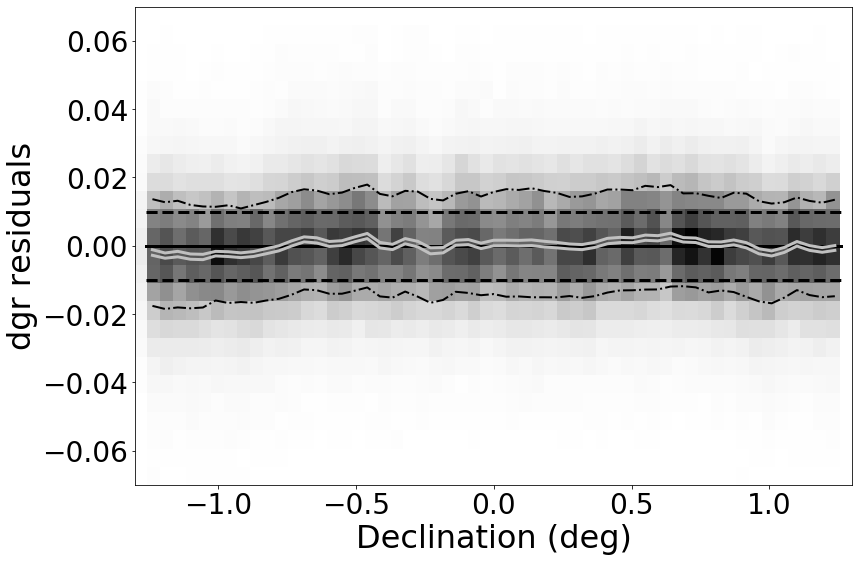

made plot colorResidDES42bright_dgr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -3.990200001222771e-06 std.dev.All: 0.014764440431325196
N= 302690 min= -0.2867319485999978 max= 0.2927874595999974
median: 0.00023720199999853735 std.dev: 0.003526533587491875
saved plot as: colorResidDES42bright_dgr_rmag.png


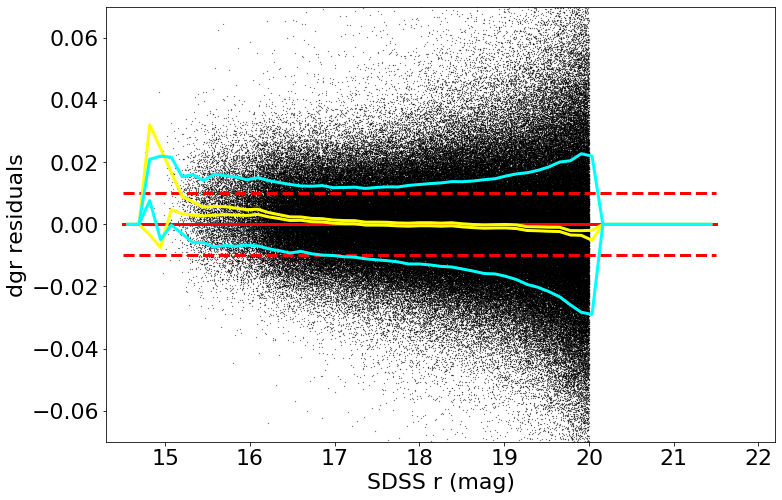

made plot colorResidDES42bright_dgr_rmag.png
medianAll: -3.990200001222771e-06 std.dev.All: 0.014764440431325196
N= 302690 min= -0.2867319485999978 max= 0.2927874595999974
median: 0.00023720199999853735 std.dev: 0.003526533587491875
saved plot as: colorResidDES42bright_dgr_rmag_Hess.png


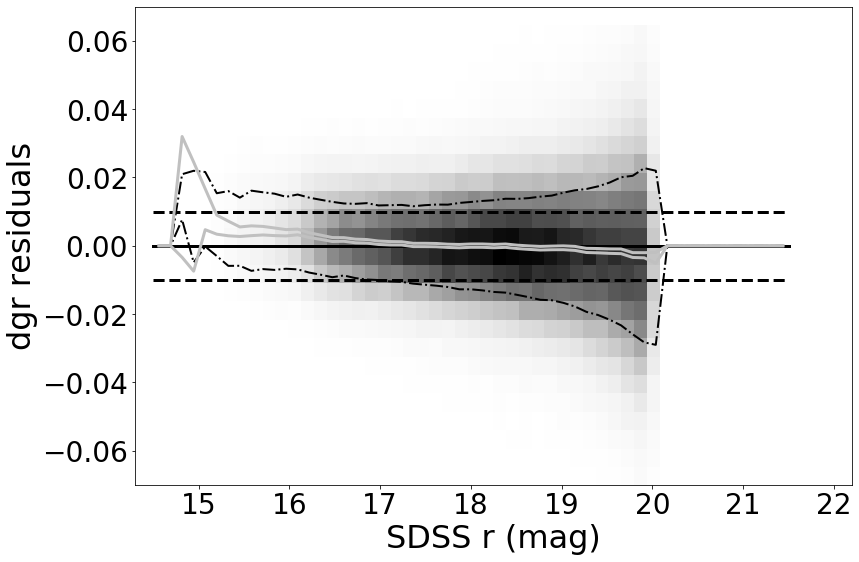

made plot colorResidDES42bright_dgr_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -8.555999991000096e-07 std.dev.All: 0.011767153655402252
N= 302705 min= -0.2732491959999994 max= 0.29043000640000116
median: 0.0025592093000010594 std.dev: 0.00482768155279292
saved plot as: colorResidDES42bright_dri_RA.png


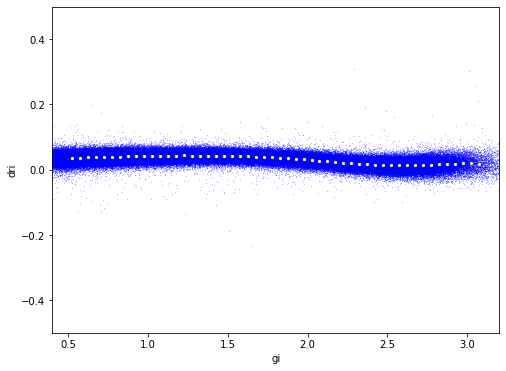

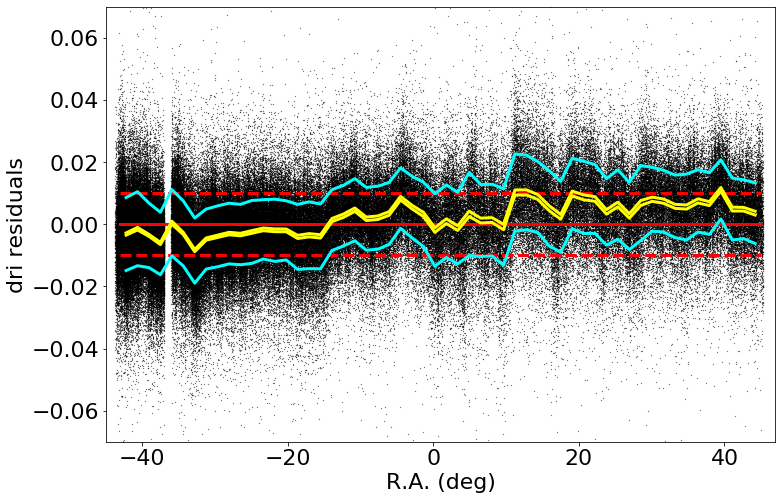

made plot colorResidDES42bright_dri_RA.png
medianAll: -8.555999991000096e-07 std.dev.All: 0.011767153655402252
N= 302705 min= -0.2732491959999994 max= 0.29043000640000116
median: 0.0024975286999954494 std.dev: 0.0048426703122201225
saved plot as: colorResidDES42bright_dri_RA_Hess.png


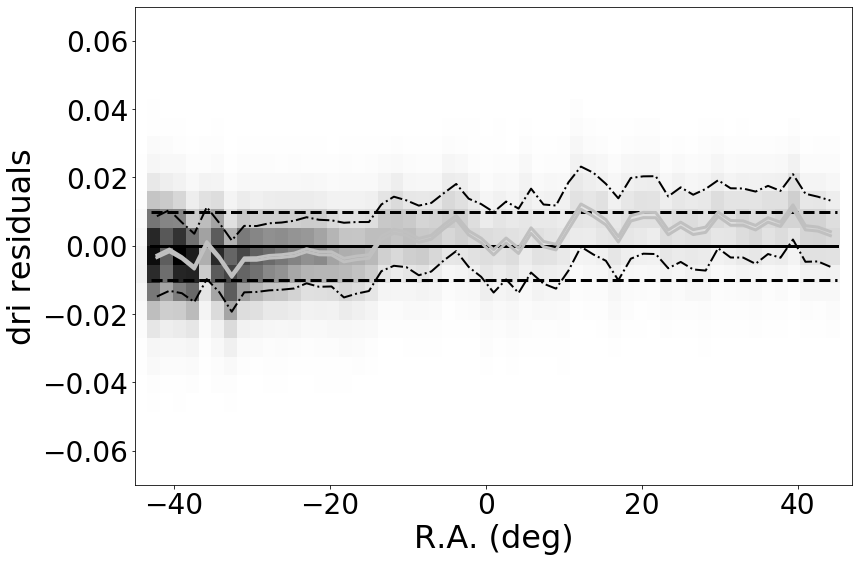

made plot colorResidDES42bright_dri_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -8.555999991000096e-07 std.dev.All: 0.011767153655402252
N= 302705 min= -0.2732491959999994 max= 0.29043000640000116
median: 0.0002861419499993502 std.dev: 0.001118047590885943
saved plot as: colorResidDES42bright_dri_Dec.png


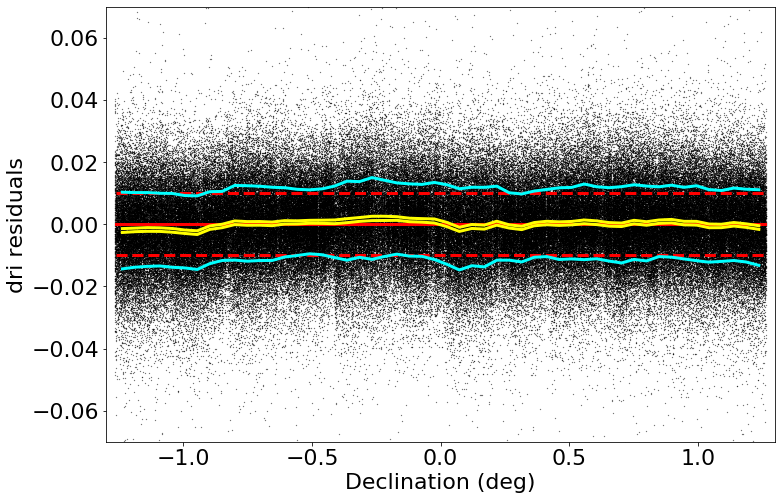

made plot colorResidDES42bright_dri_Dec.png
medianAll: -8.555999991000096e-07 std.dev.All: 0.011767153655402252
N= 302705 min= -0.2732491959999994 max= 0.29043000640000116
median: 0.00020052559999797145 std.dev: 0.0011557392869809074
saved plot as: colorResidDES42bright_dri_Dec_Hess.png


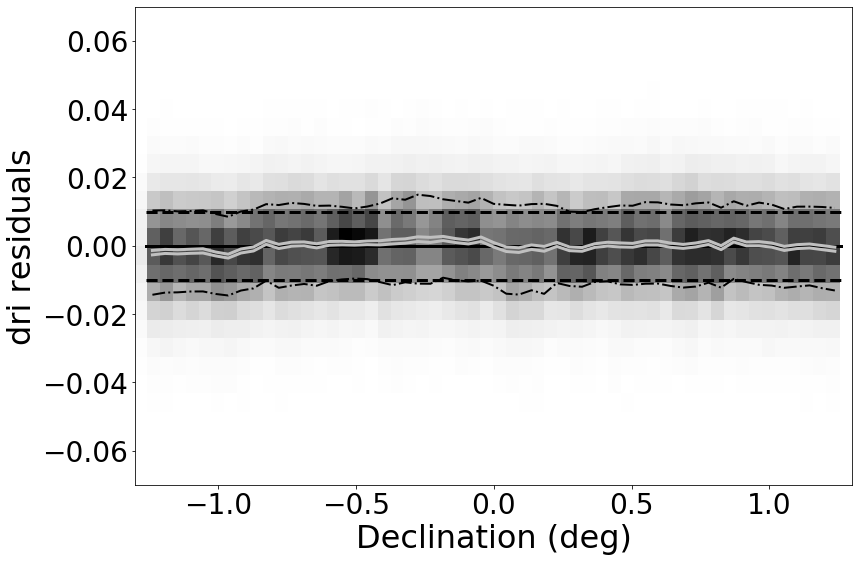

made plot colorResidDES42bright_dri_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -8.555999991000096e-07 std.dev.All: 0.011767153655402252
N= 302705 min= -0.2732491959999994 max= 0.29043000640000116
median: 0.0005213671499968327 std.dev: 0.0021646753256779573
saved plot as: colorResidDES42bright_dri_rmag.png


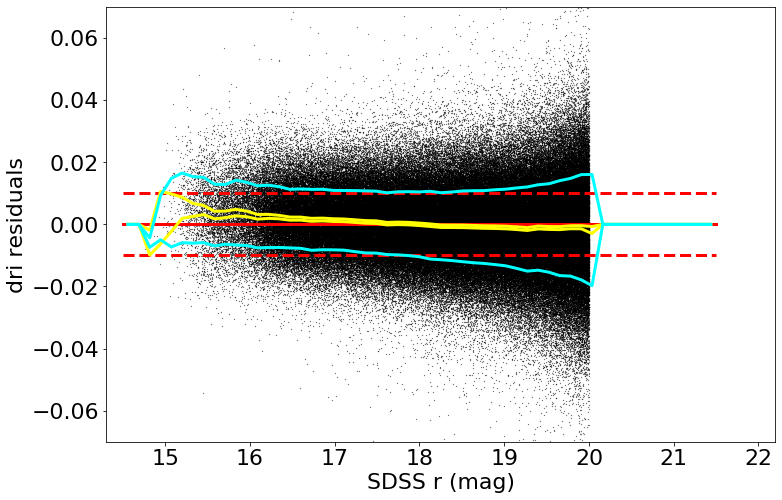

made plot colorResidDES42bright_dri_rmag.png
medianAll: -8.555999991000096e-07 std.dev.All: 0.011767153655402252
N= 302705 min= -0.2732491959999994 max= 0.29043000640000116
median: 0.0005213671499968327 std.dev: 0.0021646753256779573
saved plot as: colorResidDES42bright_dri_rmag_Hess.png


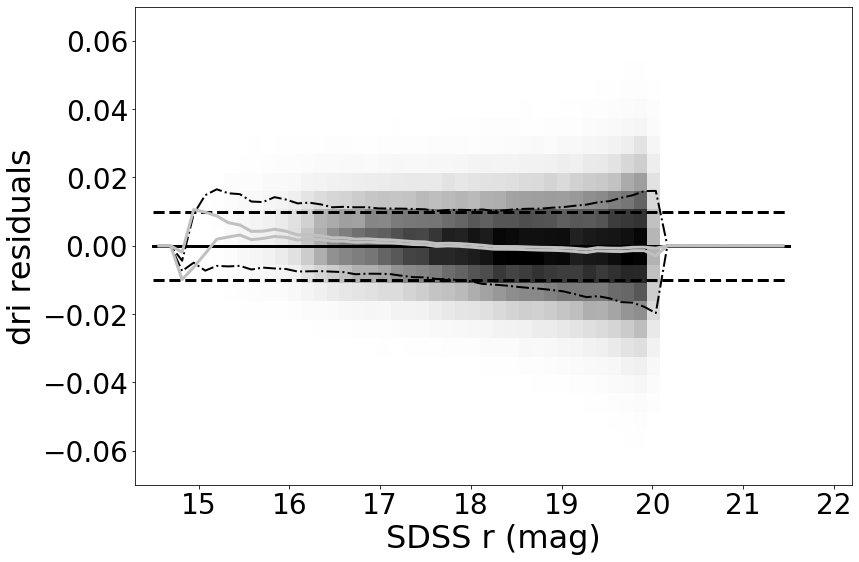

made plot colorResidDES42bright_dri_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: -1.40668999991031e-05 std.dev.All: 0.015614526579598232
N= 302685 min= -0.2805867499999977 max= 0.18183684000000078
median: -0.00042201939999885266 std.dev: 0.007997029714048665
saved plot as: colorResidDES42bright_diz_RA.png


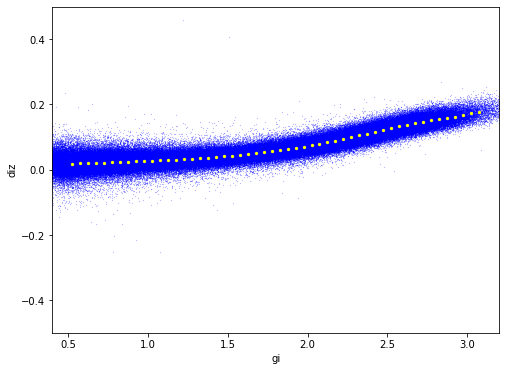

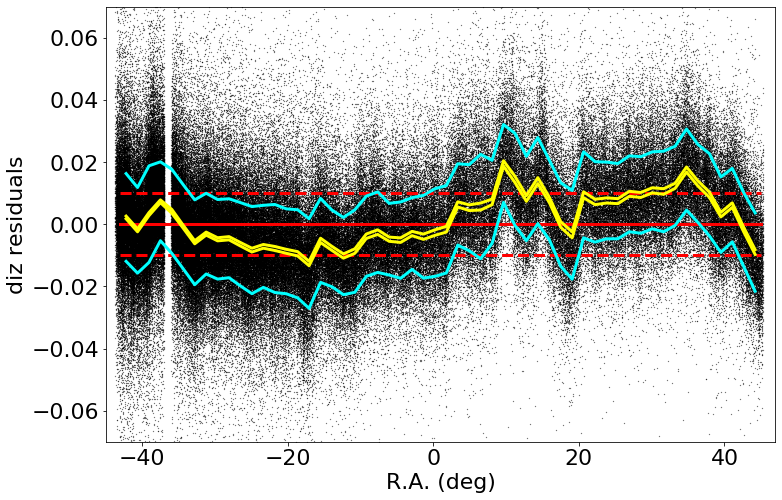

made plot colorResidDES42bright_diz_RA.png
medianAll: -1.40668999991031e-05 std.dev.All: 0.015614526579598232
N= 302685 min= -0.2805867499999977 max= 0.18183684000000078
median: 0.002026331600000958 std.dev: 0.007928386038264016
saved plot as: colorResidDES42bright_diz_RA_Hess.png


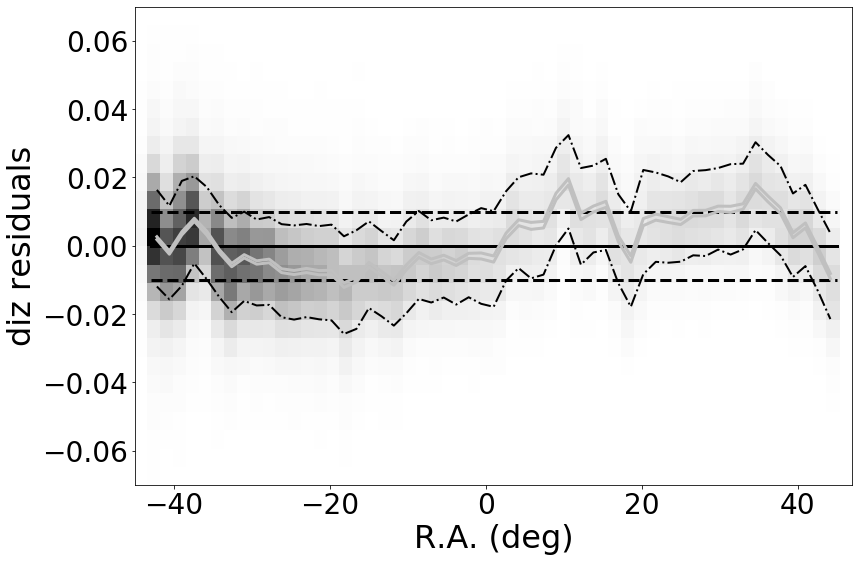

made plot colorResidDES42bright_diz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.40668999991031e-05 std.dev.All: 0.015614526579598232
N= 302685 min= -0.2805867499999977 max= 0.18183684000000078
median: -0.00031396709999938904 std.dev: 0.0025266065454985277
saved plot as: colorResidDES42bright_diz_Dec.png


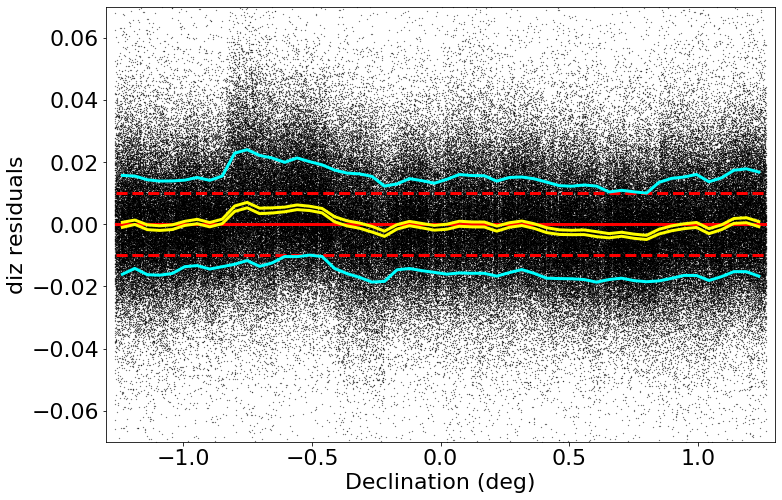

made plot colorResidDES42bright_diz_Dec.png
medianAll: -1.40668999991031e-05 std.dev.All: 0.015614526579598232
N= 302685 min= -0.2805867499999977 max= 0.18183684000000078
median: -0.00039736920000026793 std.dev: 0.0025511179779766
saved plot as: colorResidDES42bright_diz_Dec_Hess.png


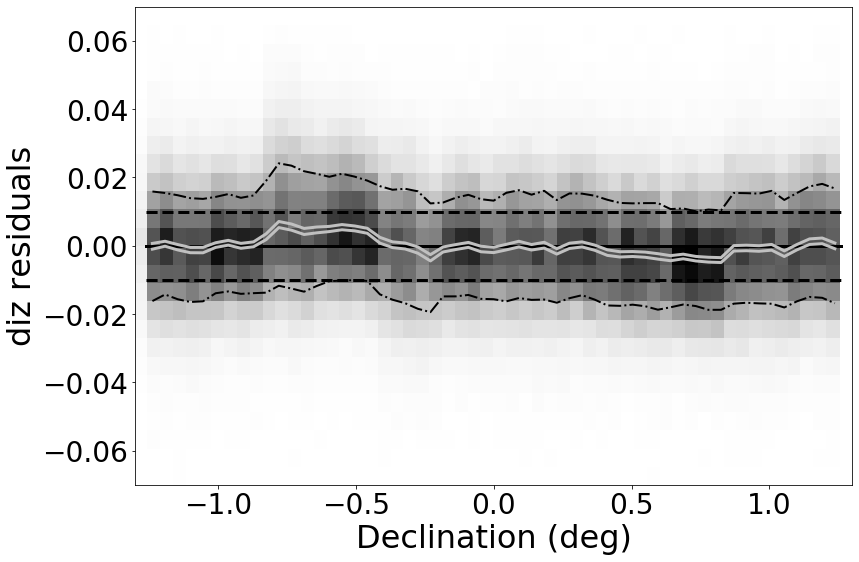

made plot colorResidDES42bright_diz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.40668999991031e-05 std.dev.All: 0.015614526579598232
N= 302685 min= -0.2805867499999977 max= 0.18183684000000078
median: -0.0002279978999995269 std.dev: 0.0047751729528936835
saved plot as: colorResidDES42bright_diz_rmag.png


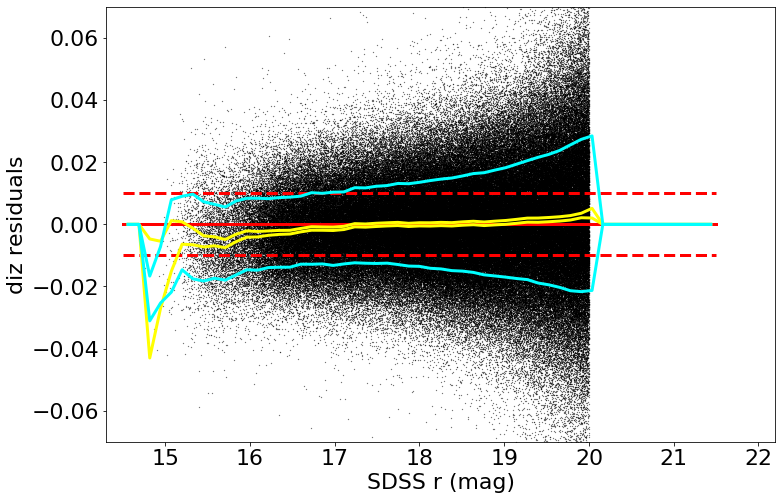

made plot colorResidDES42bright_diz_rmag.png
medianAll: -1.40668999991031e-05 std.dev.All: 0.015614526579598232
N= 302685 min= -0.2805867499999977 max= 0.18183684000000078
median: -0.0002279978999995269 std.dev: 0.0047751729528936835
saved plot as: colorResidDES42bright_diz_rmag_Hess.png


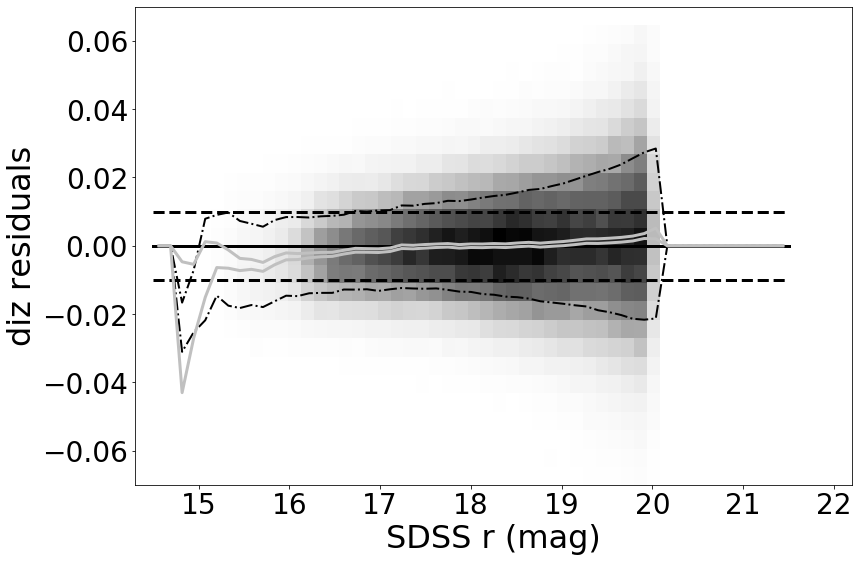

made plot colorResidDES42bright_diz_rmag_Hess.png
------------------------------------------------------------------


In [24]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidDES42bright_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssDESbright, keywords)